# **Stock Market Prediction** 📈
Predicting stock market performance involves forecasting the future value of a specific stock, a particular sector, or the overall market. This service is highly sought after by companies looking to capitalize on their stock's trends for profit. However, it's a challenging task due to the stock market's sensitivity to various global factors, leading to its unpredictability and volatility.

In [1]:
!pip install pmdarima

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 27.1 MB/s eta 0:00:00


In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.style as style


%matplotlib inline
# style.use('ggplot')
sns.set_theme(style="darkgrid")
from ydata_profiling import ProfileReport
# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/opt/conda/lib/python3.10/site-packages/numba/core/decorators.py:262: NumbaDeprecationWarning: numba.generated_jit is deprecated. Please see the documentation at: https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-generated-jit for more information and advice on a suitable replacement.
  warnings.warn(msg, NumbaDeprecationWarning)
/opt/conda/lib/python3.10/site-packages/visions/backends/shared/nan_handling.py:51: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def hasna(x: np.ndarray) -> bool:


/kaggle/input/ue21cs342aa2/sample_submission.csv
/kaggle/input/ue21cs342aa2/train.csv
/kaggle/input/ue21cs342aa2/test.csv


# EDA
columns: 

- Date
- Open
- Close
- Volume
- Strategy

In [3]:
train = pd.read_csv("/kaggle/input/ue21cs342aa2/train.csv", index_col = 'Date', parse_dates=['Date'])
test = pd.read_csv("/kaggle/input/ue21cs342aa2/test.csv", index_col = 0, parse_dates=['Date'])

In [4]:
display(train.head())
display(train.describe())
display(train.info())
print(train.index.dtype)

,id,Open,Close,Volume,Strategy
Date,,,,,
2015-06-01,0,66.208486,75.609978,298506300,Hold
2015-06-08,1,64.116235,74.443331,227974800,Hold
2015-06-15,2,47.701942,71.140831,250670900,Buy
2015-06-22,3,54.754816,72.881344,223614300,Hold
2015-06-29,4,48.031899,66.284718,406814900,Buy


,id,Open,Close,Volume
count,300.000000,300.000000,300.000000,3.000000e+02
mean,149.500000,75.977813,79.430489,1.866300e+08
std,86.746758,16.158343,13.878395,7.952792e+07
min,0.000000,40.269435,47.979353,5.991330e+07
25%,74.750000,64.872395,69.689227,1.324862e+08
50%,149.500000,79.805683,82.991900,1.715536e+08
75%,224.250000,88.342927,89.719145,2.201842e+08
max,299.000000,102.558322,103.119373,6.935702e+08


<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 300 entries, 2015-06-01 to 2021-02-22
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   id        300 non-null    int64  
 1   Open      300 non-null    float64
 2   Close     300 non-null    float64
 3   Volume    300 non-null    int64  
 4   Strategy  300 non-null    object 
dtypes: float64(2), int64(2), object(1)
memory usage: 14.1+ KB


None

datetime64[ns]


In [5]:
display(test.head())
display(test.describe())
display(test.info())

,Date,Open,Volume
id,,,
0,2021-03-01,72.708331,205897600
1,2021-03-08,73.310886,214095600
2,2021-03-15,70.610119,151601700
3,2021-03-22,70.256017,193982500
4,2021-03-29,68.258324,220238400


,Date,Open,Volume
count,100,100.000000,1.000000e+02
mean,2022-02-10 12:00:00,70.265016,1.975365e+08
min,2021-03-01 00:00:00,51.825792,6.182620e+07
25%,2021-08-21 06:00:00,63.318829,1.584331e+08
50%,2022-02-10 12:00:00,71.470649,1.928077e+08
75%,2022-08-02 18:00:00,77.451497,2.263687e+08
max,2023-01-23 00:00:00,89.752238,4.508312e+08
std,NaN,9.010469,5.856774e+07


<class 'pandas.core.frame.DataFrame'>
Index: 100 entries, 0 to 99
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Date    100 non-null    datetime64[ns]
 1   Open    100 non-null    float64       
 2   Volume  100 non-null    int64         
dtypes: datetime64[ns](1), float64(1), int64(1)
memory usage: 3.1 KB


None

In [6]:
profile = ProfileReport(train, title="Pandas Profiling Report")

In [7]:
train.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [8]:
train.loc[:,['Open', 'Close', 'Volume']].corr()

,Open,Close,Volume
Open,1.000000,0.927795,-0.461010
Close,0.927795,1.000000,-0.458788
Volume,-0.461010,-0.458788,1.000000


# Feature Engineering for Closing price prediction

- **Open_lag (Lag Feature)**: Represents the lag of the 'Open' price by one day. It provides historical context for the previous day's opening price. In cases where there's no historical data available (NaN), it's filled with the current day's opening price.

- **Open_lag2, Open_lag3, Open_lag4 (Additional Lag Features)**: Similar to Open_lag, these features capture the opening price from the last 2, 3, and 4 days, respectively. They offer a broader historical perspective.

- **Open_MA_20 (20-Day Moving Average)**: Computes the 20-day Simple Moving Average (SMA) of the 'Open' price. It smooths out short-term fluctuations and provides a more extended view of price trends.

- **Volume_MA_20 (20-Day Moving Average of Volume)**: Calculates the 20-day SMA of the trading volume. It reveals trends in trading activity over a 20-day period.

- **Open_Volatility (20-Day Rolling Standard Deviation)**: Measures the 20-day rolling standard deviation of the 'Open' price. It quantifies price volatility within the specified period.

- **Weekly_Return (Weekly Percentage Return)**: Calculates the weekly return of the 'Open' price as a percentage change. It gauges weekly price movement.

- **Volume_Lag1 (Lag Feature for Volume)**: Represents the lag of trading volume by one day, providing historical context for volume data.

- **Volume_Rolling_Std (5-Day Rolling Standard Deviation of Volume)**: Measures the 5-day rolling standard deviation of trading volume. It captures short-term volatility in trading volume.

- **Price_Change (One-Day Price Change)**: Computes the one-day absolute change in the 'Open' price. It reveals the magnitude of price movements on a daily basis.

- **Volume_Change (One-Day Volume Change)**: Similar to Price_Change, this feature calculates the one-day change in trading volume, indicating shifts in trading activity.

- **SMA_5_Open, SMA_10_Open, SMA_20_Open (Moving Averages for 'Open' Price)**: Calculate 5-day, 10-day, and 20-day SMAs of the 'Open' price. These help identify different trends over varying timeframes.

- **SMA_5_Volume, SMA_10_Volume, SMA_20_Volume (Moving Averages for Volume)**: Similar to the SMAs for 'Open,' these features calculate SMAs of trading volume, allowing trend analysis over different time periods.

- **EMA_5_Open, EMA_10_Open, EMA_20_Open (Exponential Moving Averages for 'Open' Price)**: Calculate 5-day, 10-day, and 20-day Exponential Moving Averages (EMAs) of the 'Open' price. EMAs assign more weight to recent data, making them responsive to short-term price changes.

- **EMA_5_Volume, EMA_10_Volume, EMA_20_Volume (Exponential Moving Averages for Volume)**: These features calculate EMAs of trading volume, capturing short-term volume trends with higher sensitivity to recent data.

In [9]:
def create_features_ts(data):
    data['Open_lag'] = data['Open'].shift(1)
    data['Open_lag'] = data['Open_lag'].mask(data['Open_lag'].isna(), data['Open'])
    data['Open_lag2'] = data['Open'].shift(2)
    data['Open_lag3'] = data['Open'].shift(3)
    data['Open_lag4'] = data['Open'].shift(4)
    data['Open_MA_20'] = data['Open'].rolling(window=20).mean()
    data['Volume_MA_20'] = data['Volume'].rolling(window=20).mean()
    data['Open_Volatility'] = data['Open'].rolling(window=20).std()
    data['Weekly_Return'] = data['Open'].pct_change()
    window_size = 5
    data['Volume_Lag1'] = data['Volume'].shift(1)
    data['Volume_Rolling_Std'] = data['Volume'].rolling(window=window_size).std()
    data['Price_Change'] = data['Open'].diff()
    #data['Percentage_Price_Change'] = (data['Open'].pct_change() * 100)

    data['Volume_Change'] = data['Volume'].diff()
    #data['Percentage_Volume_Change'] = (data['Volume'].pct_change() * 100)

    # Calculate Moving Averages
    data['SMA_5_Open'] = data['Open'].rolling(window=5).mean()
    data['SMA_10_Open'] = data['Open'].rolling(window=10).mean()
    data['SMA_20_Open'] = data['Open'].rolling(window=20).mean()

    data['SMA_5_Volume'] = data['Volume'].rolling(window=5).mean()
    data['SMA_10_Volume'] = data['Volume'].rolling(window=10).mean()
    data['SMA_20_Volume'] = data['Volume'].rolling(window=20).mean()
    
    # Calculating Exponential moving average
    data['EMA_5_Open'] = data['Open'].ewm(span=5, adjust=False).mean()
    data['EMA_10_Open'] = data['Open'].ewm(span=10, adjust=False).mean()
    data['EMA_20_Open'] = data['Open'].ewm(span=20, adjust=False).mean()
    
    data['EMA_5_Volume'] = data['Volume'].ewm(span=5, adjust=False).mean()
    data['EMA_10_Volume'] = data['Volume'].ewm(span=10, adjust=False).mean()
    data['EMA_20_Volume'] = data['Volume'].ewm(span=20, adjust=False).mean()
    
    data.fillna(method='bfill', inplace=True)
    return data
    
train['Lag_1'] = train['Close'].shift(1)
train['Lag_1'] = train['Lag_1'].mask(train['Lag_1'].isna(), train['Close'])    
train = create_features_ts(train)
train.fillna(method='bfill', inplace=True)
train.head()

,id,Open,Close,Volume,Strategy,Lag_1,Open_lag,Open_lag2,Open_lag3,Open_lag4,...,SMA_20_Open,SMA_5_Volume,SMA_10_Volume,SMA_20_Volume,EMA_5_Open,EMA_10_Open,EMA_20_Open,EMA_5_Volume,EMA_10_Volume,EMA_20_Volume
Date,,,,,,,,,,,,,,,,,,,,,
2015-06-01,0,66.208486,75.609978,298506300,Hold,75.609978,66.208486,66.208486,66.208486,66.208486,...,52.335565,281516240.0,360090440.0,343104950.0,66.208486,66.208486,66.208486,298506300.0,2.985063e+08,2.985063e+08
2015-06-08,1,64.116235,74.443331,227974800,Hold,75.609978,66.208486,66.208486,66.208486,66.208486,...,52.335565,281516240.0,360090440.0,343104950.0,65.511069,65.828077,66.009224,274995800.0,2.856824e+08,2.917890e+08
2015-06-15,2,47.701942,71.140831,250670900,Buy,74.443331,64.116235,66.208486,66.208486,66.208486,...,52.335565,281516240.0,360090440.0,343104950.0,59.574693,62.532416,64.265673,266887500.0,2.793167e+08,2.878730e+08
2015-06-22,3,54.754816,72.881344,223614300,Hold,71.140831,47.701942,64.116235,66.208486,66.208486,...,52.335565,281516240.0,360090440.0,343104950.0,57.968068,61.118307,63.359877,252463100.0,2.691890e+08,2.817531e+08
2015-06-29,4,48.031899,66.284718,406814900,Buy,72.881344,54.754816,47.701942,64.116235,66.208486,...,52.335565,281516240.0,360090440.0,343104950.0,54.656012,58.738960,61.900070,303913700.0,2.942119e+08,2.936638e+08


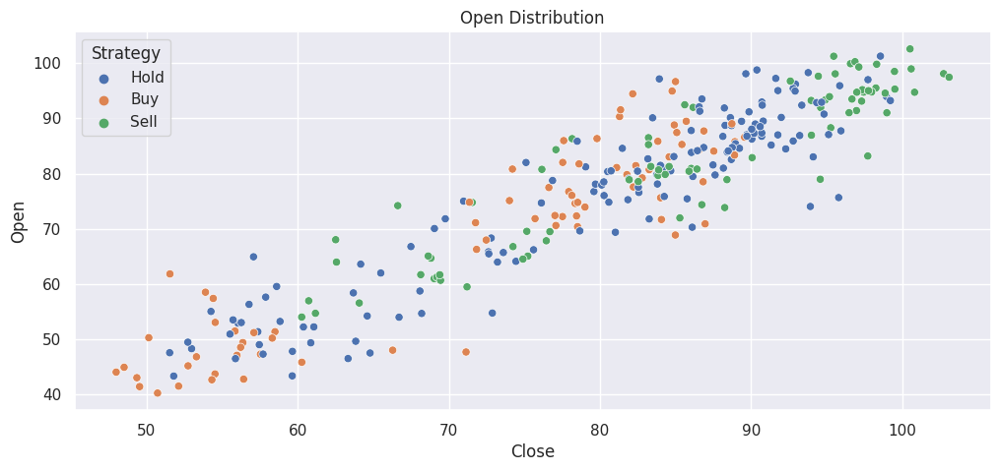

Feature: Open
Description:
count    300.000000
mean      75.977813
std       16.158343
min       40.269435
25%       64.872395
50%       79.805683
75%       88.342927
max      102.558322
Name: Open, dtype: float64



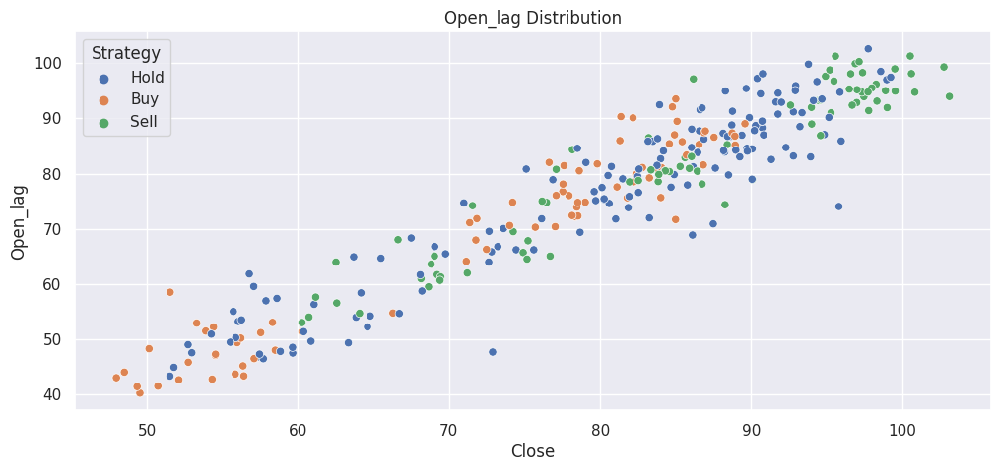

Feature: Open_lag
Description:
count    300.000000
mean      75.966446
std       16.164030
min       40.269435
25%       64.872395
50%       79.805683
75%       88.342927
max      102.558322
Name: Open_lag, dtype: float64



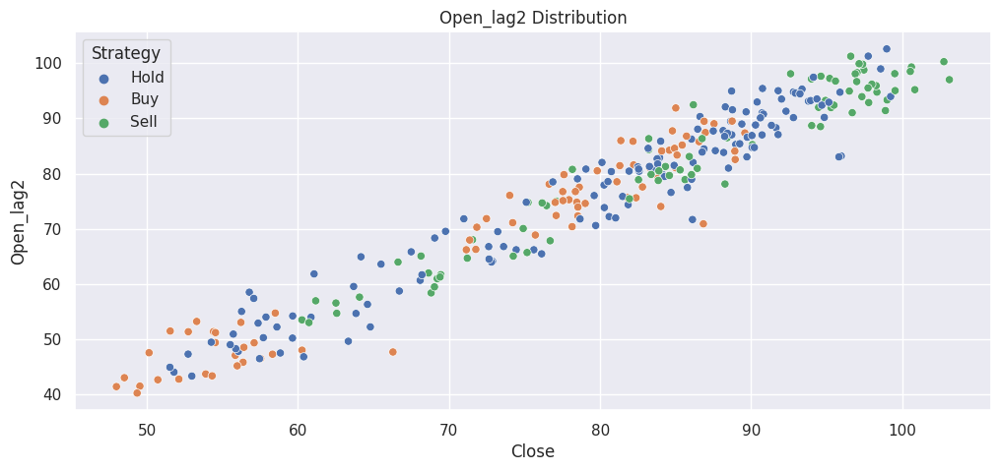

Feature: Open_lag2
Description:
count    300.000000
mean      75.955900
std       16.169378
min       40.269435
25%       64.872395
50%       79.805683
75%       88.342927
max      102.558322
Name: Open_lag2, dtype: float64



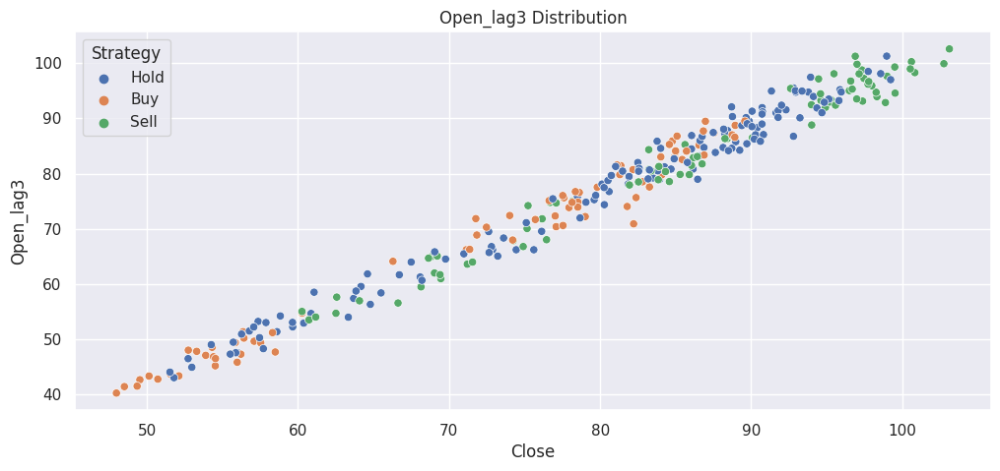

Feature: Open_lag3
Description:
count    300.000000
mean      75.937313
std       16.177392
min       40.269435
25%       64.872395
50%       79.805683
75%       88.342927
max      102.558322
Name: Open_lag3, dtype: float64



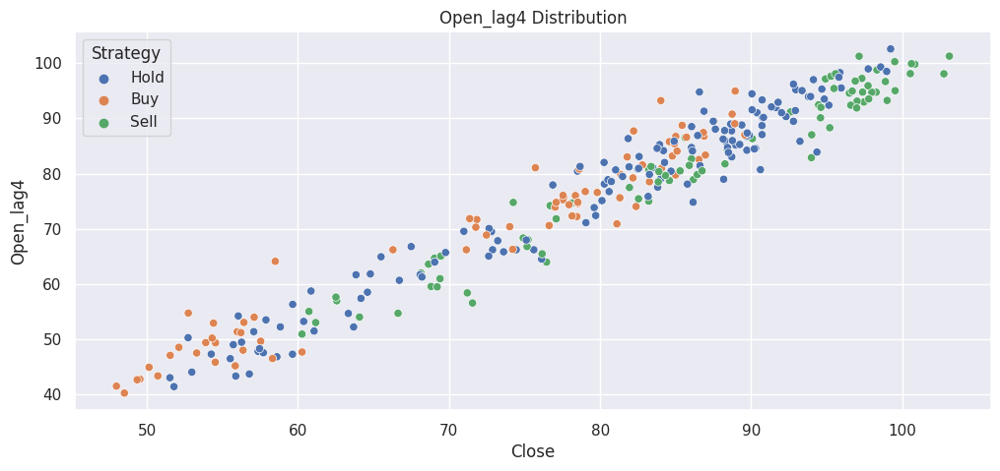

Feature: Open_lag4
Description:
count    300.000000
mean      75.918107
std       16.185536
min       40.269435
25%       64.872395
50%       79.805683
75%       88.342927
max      102.558322
Name: Open_lag4, dtype: float64



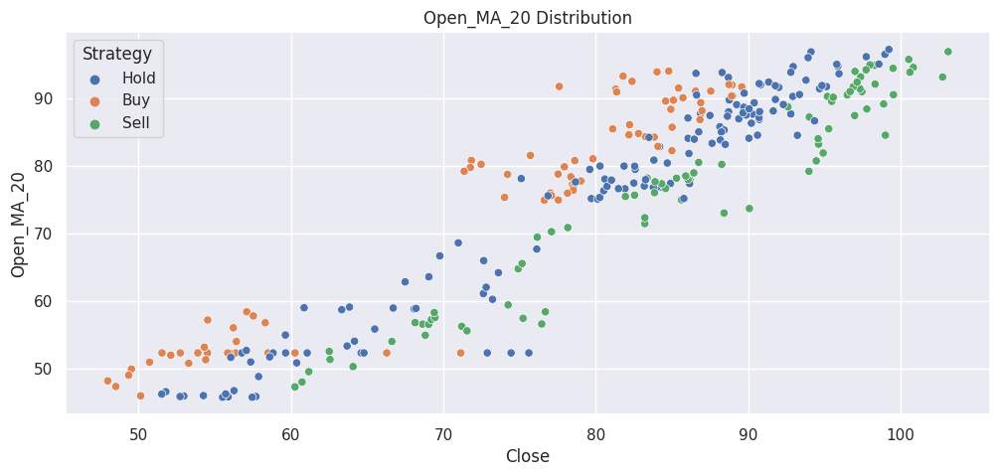

Feature: Open_MA_20
Description:
count    300.000000
mean      75.192031
std       15.768809
min       45.783410
25%       58.409860
50%       78.738964
75%       88.773908
max       97.174420
Name: Open_MA_20, dtype: float64



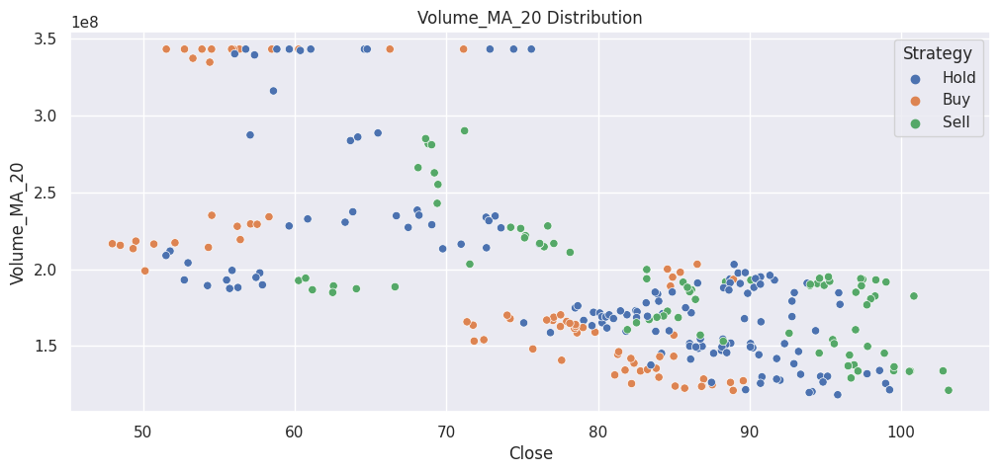

Feature: Volume_MA_20
Description:
count    3.000000e+02
mean     1.918577e+08
std      5.816657e+07
min      1.182823e+08
25%      1.515960e+08
50%      1.804722e+08
75%      2.132633e+08
max      3.431050e+08
Name: Volume_MA_20, dtype: float64



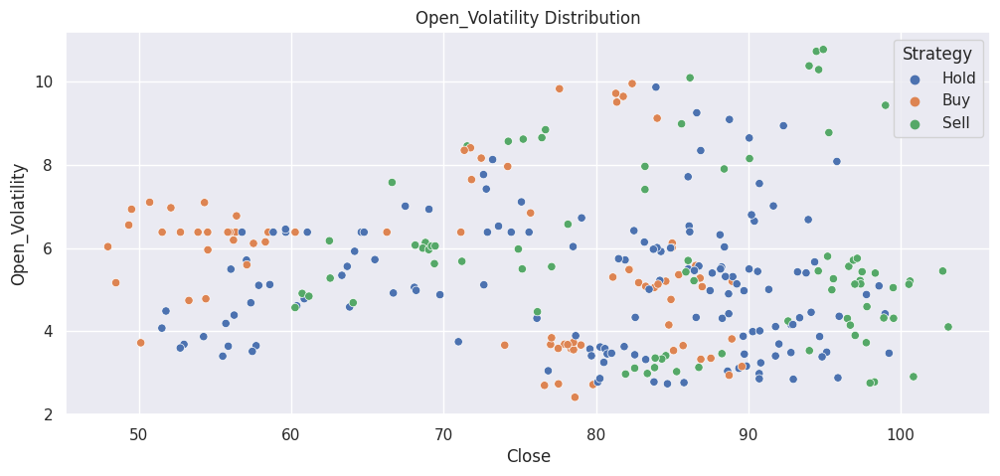

Feature: Open_Volatility
Description:
count    300.000000
mean       5.379247
std        1.809000
min        2.411137
25%        3.835685
50%        5.220890
75%        6.383264
max       10.779704
Name: Open_Volatility, dtype: float64



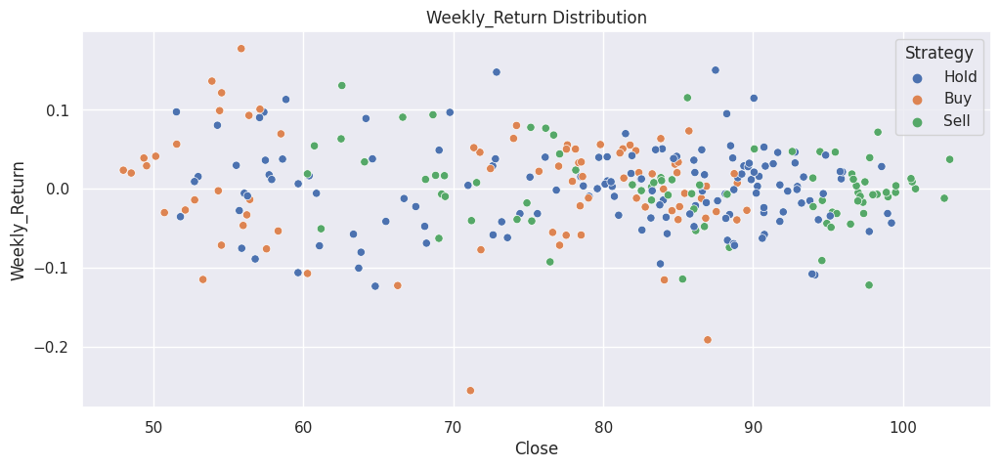

Feature: Weekly_Return
Description:
count    300.000000
mean       0.001590
std        0.054935
min       -0.256008
25%       -0.031417
50%        0.003739
75%        0.033944
max        0.177701
Name: Weekly_Return, dtype: float64



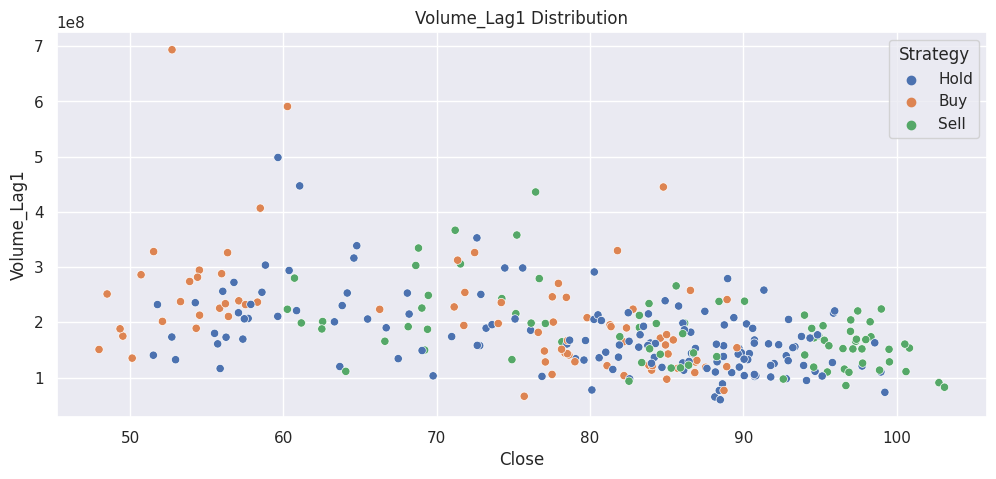

Feature: Volume_Lag1
Description:
count    3.000000e+02
mean     1.865151e+08
std      7.934043e+07
min      5.991330e+07
25%      1.324862e+08
50%      1.715536e+08
75%      2.201842e+08
max      6.935702e+08
Name: Volume_Lag1, dtype: float64



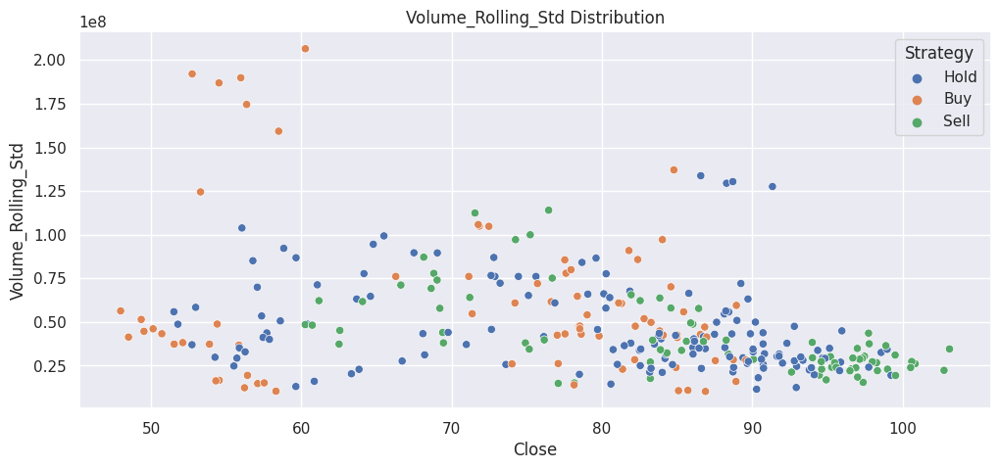

Feature: Volume_Rolling_Std
Description:
count    3.000000e+02
mean     4.831818e+07
std      3.187322e+07
min      1.023613e+07
25%      2.758297e+07
50%      3.960768e+07
75%      6.088414e+07
max      2.065113e+08
Name: Volume_Rolling_Std, dtype: float64



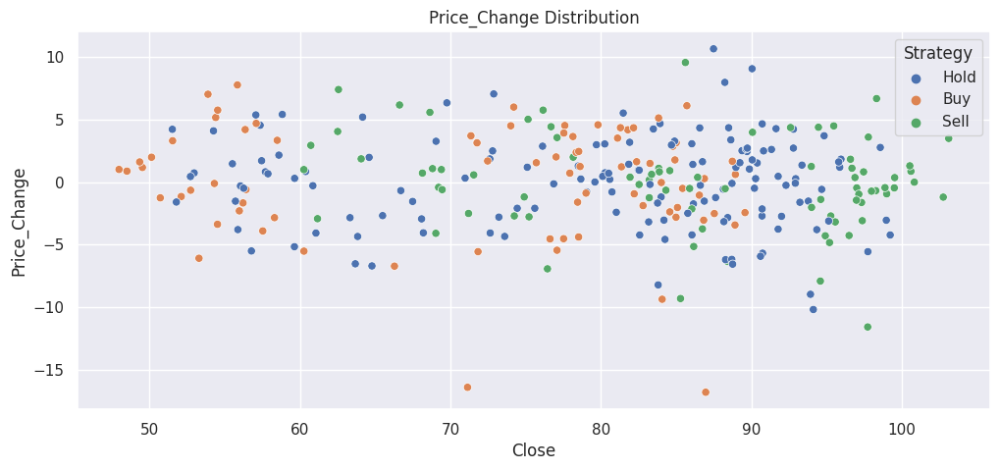

Feature: Price_Change
Description:
count    300.000000
mean       0.004393
std        3.868598
min      -16.809540
25%       -2.418942
50%        0.309912
75%        2.537768
max       10.661784
Name: Price_Change, dtype: float64



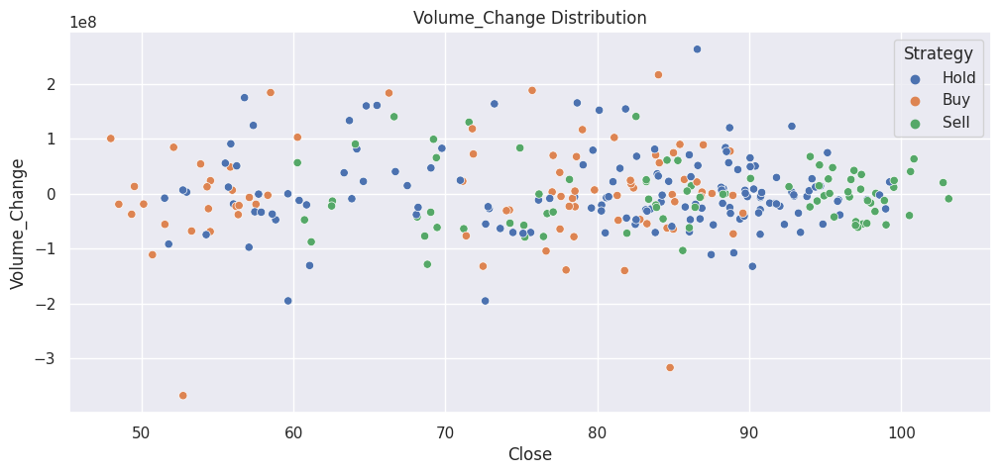

Feature: Volume_Change
Description:
count    3.000000e+02
mean    -1.201953e+05
std      7.228864e+07
min     -3.673455e+08
25%     -3.801590e+07
50%     -5.476150e+06
75%      3.287942e+07
max      2.628416e+08
Name: Volume_Change, dtype: float64



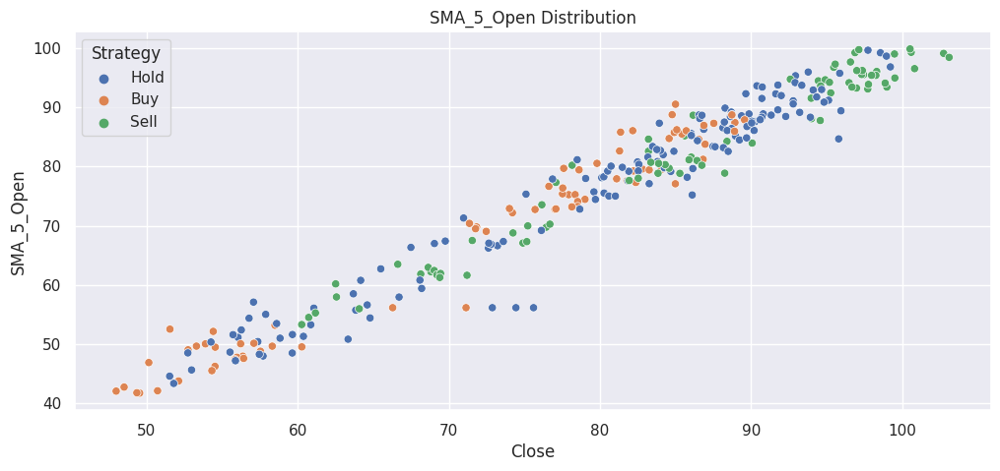

Feature: SMA_5_Open
Description:
count    300.000000
mean      75.853667
std       15.943709
min       41.741680
25%       62.653850
50%       79.678411
75%       88.330899
max       99.864613
Name: SMA_5_Open, dtype: float64



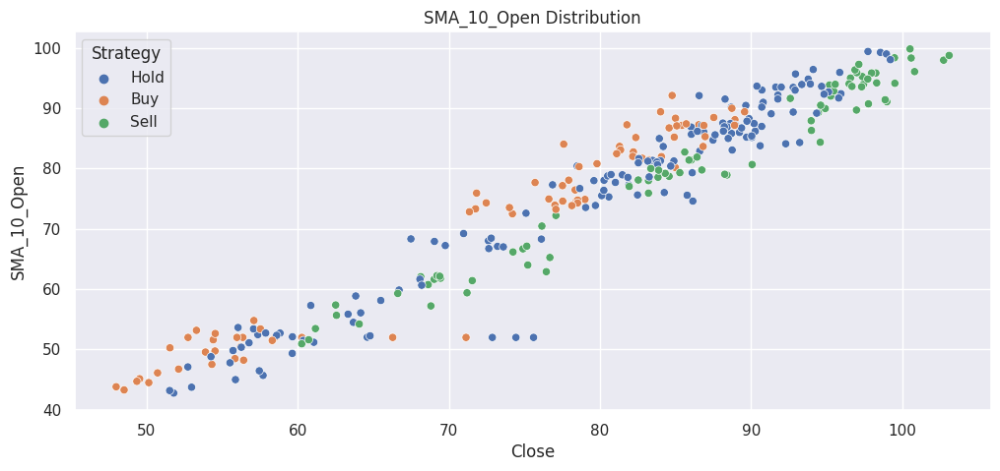

Feature: SMA_10_Open
Description:
count    300.000000
mean      75.596716
std       15.927277
min       42.750368
25%       61.748206
50%       79.715540
75%       87.588529
max       99.802588
Name: SMA_10_Open, dtype: float64



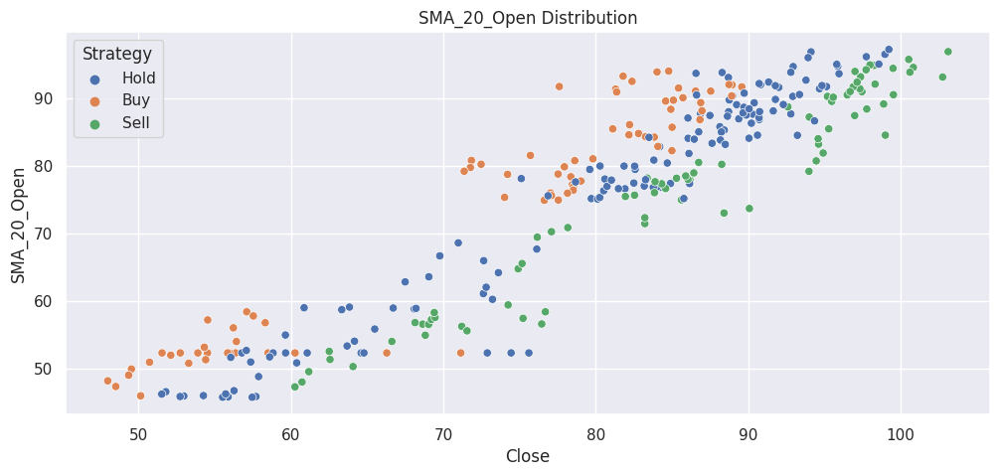

Feature: SMA_20_Open
Description:
count    300.000000
mean      75.192031
std       15.768809
min       45.783410
25%       58.409860
50%       78.738964
75%       88.773908
max       97.174420
Name: SMA_20_Open, dtype: float64



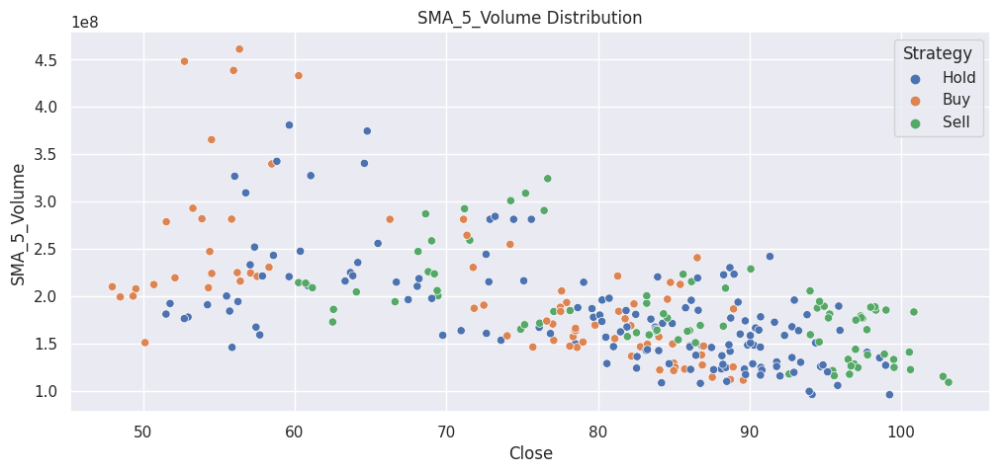

Feature: SMA_5_Volume
Description:
count    3.000000e+02
mean     1.871117e+08
std      6.096376e+07
min      9.639290e+07
25%      1.470165e+08
50%      1.763789e+08
75%      2.142870e+08
max      4.611199e+08
Name: SMA_5_Volume, dtype: float64



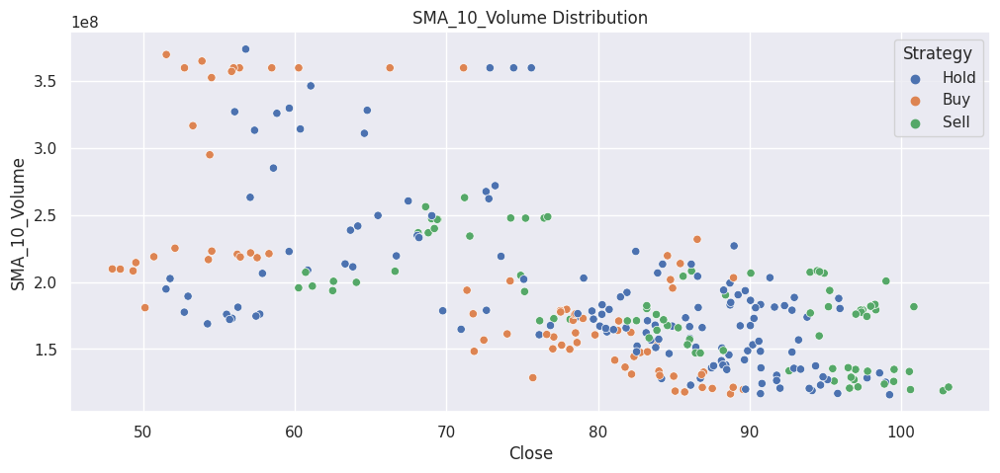

Feature: SMA_10_Volume
Description:
count    3.000000e+02
mean     1.895649e+08
std      5.954820e+07
min      1.158669e+08
25%      1.486356e+08
50%      1.764415e+08
75%      2.086403e+08
max      3.740695e+08
Name: SMA_10_Volume, dtype: float64



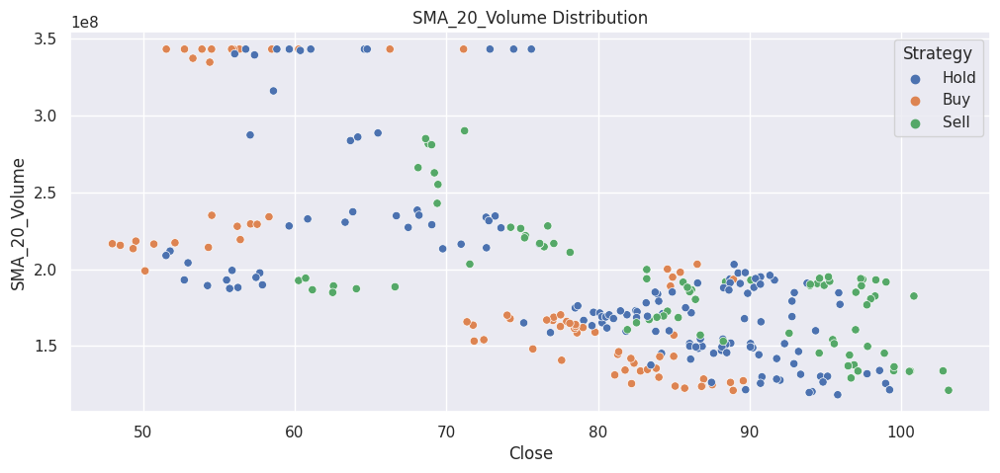

Feature: SMA_20_Volume
Description:
count    3.000000e+02
mean     1.918577e+08
std      5.816657e+07
min      1.182823e+08
25%      1.515960e+08
50%      1.804722e+08
75%      2.132633e+08
max      3.431050e+08
Name: SMA_20_Volume, dtype: float64



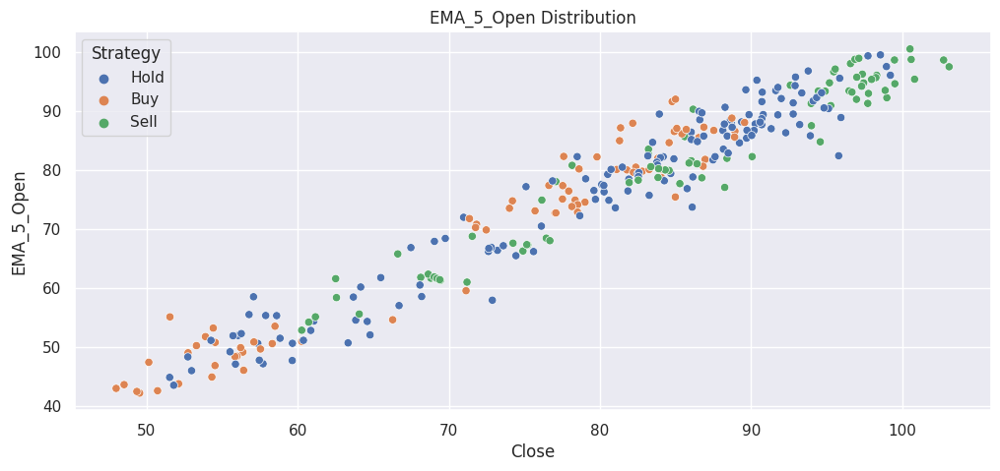

Feature: EMA_5_Open
Description:
count    300.000000
mean      75.937306
std       15.741484
min       42.235042
25%       64.727315
50%       79.993897
75%       87.952124
max      100.538050
Name: EMA_5_Open, dtype: float64



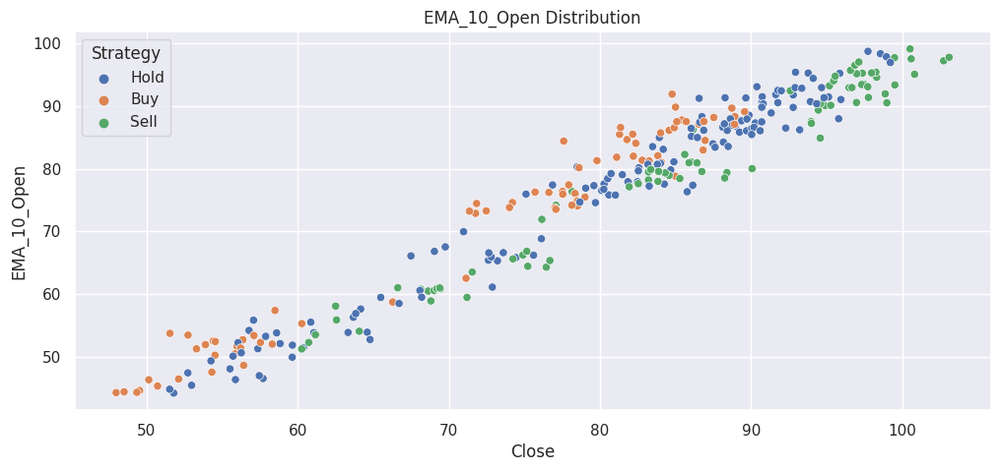

Feature: EMA_10_Open
Description:
count    300.000000
mean      75.850720
std       15.420433
min       44.216614
25%       62.178889
50%       79.528654
75%       87.813583
max       99.116806
Name: EMA_10_Open, dtype: float64



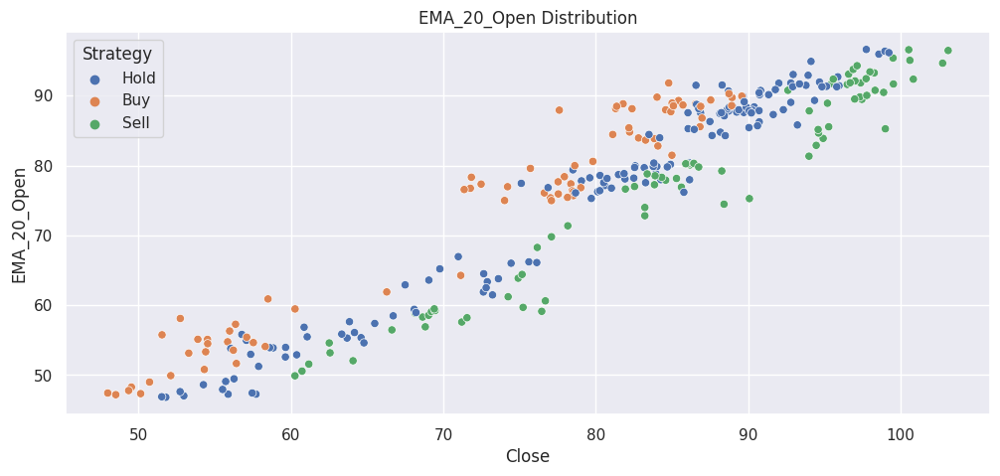

Feature: EMA_20_Open
Description:
count    300.000000
mean      75.665176
std       14.890393
min       46.827304
25%       60.391443
50%       78.833638
75%       88.402173
max       96.611350
Name: EMA_20_Open, dtype: float64



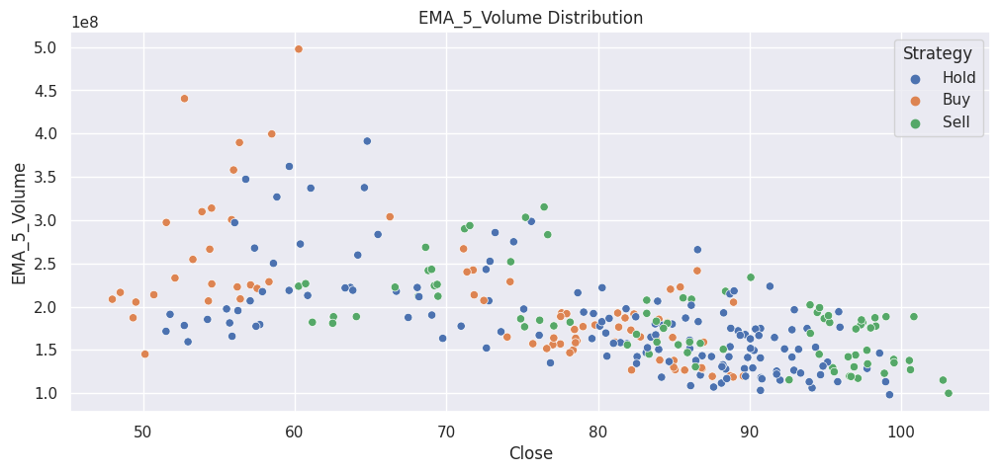

Feature: EMA_5_Volume
Description:
count    3.000000e+02
mean     1.871792e+08
std      6.009766e+07
min      9.826289e+07
25%      1.466966e+08
50%      1.775772e+08
75%      2.122999e+08
max      4.975645e+08
Name: EMA_5_Volume, dtype: float64



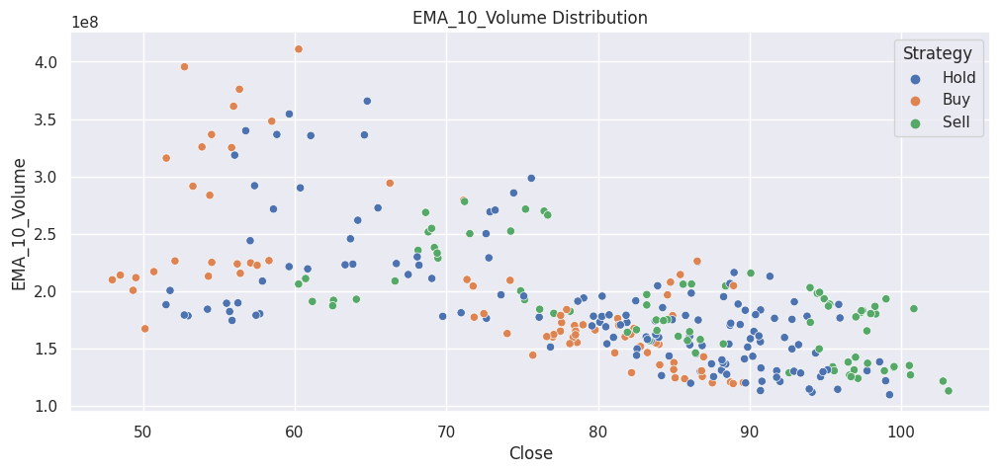

Feature: EMA_10_Volume
Description:
count    3.000000e+02
mean     1.882376e+08
std      5.592555e+07
min      1.098277e+08
25%      1.524707e+08
50%      1.781055e+08
75%      2.096337e+08
max      4.109516e+08
Name: EMA_10_Volume, dtype: float64



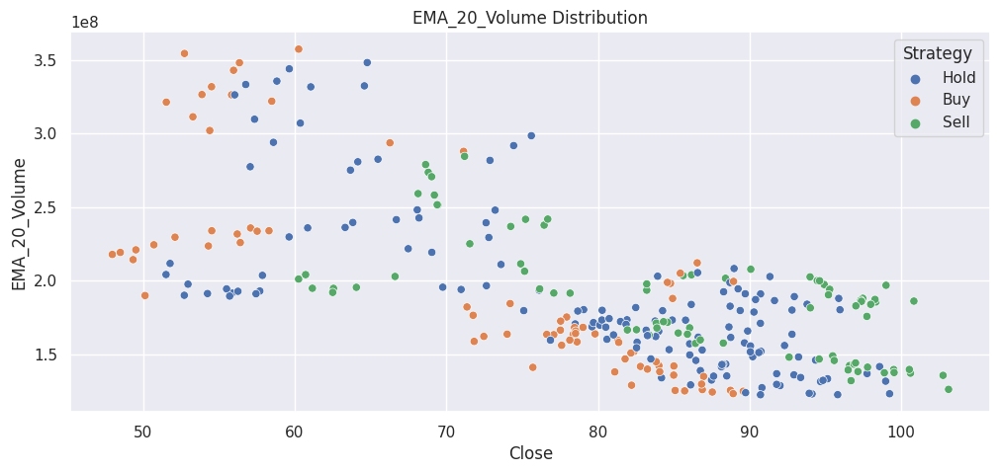

Feature: EMA_20_Volume
Description:
count    3.000000e+02
mean     1.904045e+08
std      5.396610e+07
min      1.224329e+08
25%      1.518347e+08
50%      1.796461e+08
75%      2.056663e+08
max      3.573586e+08
Name: EMA_20_Volume, dtype: float64



In [10]:
# List of feature names
feature_names = ['Open', 'Open_lag', 'Open_lag2', 'Open_lag3', 'Open_lag4', 'Open_MA_20',
                 'Volume_MA_20', 'Open_Volatility', 'Weekly_Return', 'Volume_Lag1',
                 'Volume_Rolling_Std', 'Price_Change', 'Volume_Change', 'SMA_5_Open',
                 'SMA_10_Open', 'SMA_20_Open', 'SMA_5_Volume', 'SMA_10_Volume', 'SMA_20_Volume',
                'EMA_5_Open', 'EMA_10_Open','EMA_20_Open', 'EMA_5_Volume', 'EMA_10_Volume', 'EMA_20_Volume']

# Loop through each feature, plot, and provide a brief description
for feature_name in feature_names:
    # Create a figure with two subplots
    fig, axis = plt.subplots(1, 1, figsize=(12, 5))

    # Plot the feature
    sns.scatterplot(y=train[feature_name],x=train['Close'],hue=train['Strategy'], ax=axis)
    axis.set_title(f'{feature_name} Distribution')

    # Show the figure
    plt.show()

    # Provide a brief description of the feature
    feature_description = train[feature_name].describe()
    print(f"Feature: {feature_name}")
    print(f"Description:\n{feature_description}\n")

In [11]:
display(train.head())
print(list(train.columns))

,id,Open,Close,Volume,Strategy,Lag_1,Open_lag,Open_lag2,Open_lag3,Open_lag4,...,SMA_20_Open,SMA_5_Volume,SMA_10_Volume,SMA_20_Volume,EMA_5_Open,EMA_10_Open,EMA_20_Open,EMA_5_Volume,EMA_10_Volume,EMA_20_Volume
Date,,,,,,,,,,,,,,,,,,,,,
2015-06-01,0,66.208486,75.609978,298506300,Hold,75.609978,66.208486,66.208486,66.208486,66.208486,...,52.335565,281516240.0,360090440.0,343104950.0,66.208486,66.208486,66.208486,298506300.0,2.985063e+08,2.985063e+08
2015-06-08,1,64.116235,74.443331,227974800,Hold,75.609978,66.208486,66.208486,66.208486,66.208486,...,52.335565,281516240.0,360090440.0,343104950.0,65.511069,65.828077,66.009224,274995800.0,2.856824e+08,2.917890e+08
2015-06-15,2,47.701942,71.140831,250670900,Buy,74.443331,64.116235,66.208486,66.208486,66.208486,...,52.335565,281516240.0,360090440.0,343104950.0,59.574693,62.532416,64.265673,266887500.0,2.793167e+08,2.878730e+08
2015-06-22,3,54.754816,72.881344,223614300,Hold,71.140831,47.701942,64.116235,66.208486,66.208486,...,52.335565,281516240.0,360090440.0,343104950.0,57.968068,61.118307,63.359877,252463100.0,2.691890e+08,2.817531e+08
2015-06-29,4,48.031899,66.284718,406814900,Buy,72.881344,54.754816,47.701942,64.116235,66.208486,...,52.335565,281516240.0,360090440.0,343104950.0,54.656012,58.738960,61.900070,303913700.0,2.942119e+08,2.936638e+08


['id', 'Open', 'Close', 'Volume', 'Strategy', 'Lag_1', 'Open_lag', 'Open_lag2', 'Open_lag3', 'Open_lag4', 'Open_MA_20', 'Volume_MA_20', 'Open_Volatility', 'Weekly_Return', 'Volume_Lag1', 'Volume_Rolling_Std', 'Price_Change', 'Volume_Change', 'SMA_5_Open', 'SMA_10_Open', 'SMA_20_Open', 'SMA_5_Volume', 'SMA_10_Volume', 'SMA_20_Volume', 'EMA_5_Open', 'EMA_10_Open', 'EMA_20_Open', 'EMA_5_Volume', 'EMA_10_Volume', 'EMA_20_Volume']


Features highly correlated with Close: 
Close            1.000000
Open_lag         0.949940
Open_lag2        0.970465
Open_lag3        0.990134
Open_lag4        0.973592
Open_MA_20       0.926903
Volume_MA_20    -0.663425
SMA_5_Open       0.978520
SMA_10_Open      0.967264
SMA_20_Open      0.926903
SMA_5_Volume    -0.605032
SMA_10_Volume   -0.634384
SMA_20_Volume   -0.663425
EMA_5_Open       0.972659
EMA_10_Open      0.974553
EMA_20_Open      0.949664
EMA_5_Volume    -0.611984
EMA_10_Volume   -0.659229
EMA_20_Volume   -0.689801
Name: Close, dtype: float64


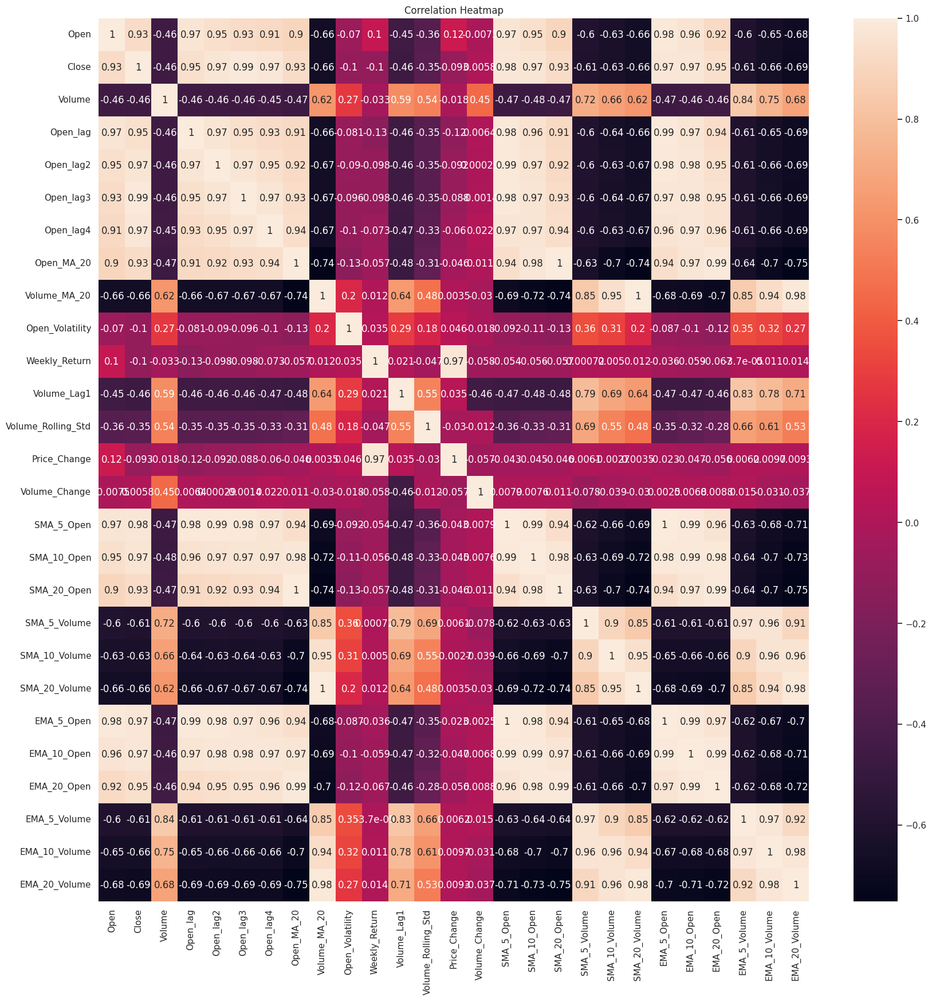

In [12]:
plt.figure(figsize=(20,20))
corr_matrix = train[['Open', 'Close', 'Volume', 'Open_lag', 'Open_lag2', 'Open_lag3', 'Open_lag4', 'Open_MA_20', 'Volume_MA_20', 'Open_Volatility', 'Weekly_Return', 'Volume_Lag1', 'Volume_Rolling_Std', 'Price_Change', 'Volume_Change', 'SMA_5_Open', 'SMA_10_Open', 'SMA_20_Open', 'SMA_5_Volume', 'SMA_10_Volume', 'SMA_20_Volume', 'EMA_5_Open', 'EMA_10_Open', 'EMA_20_Open', 'EMA_5_Volume', 'EMA_10_Volume', 'EMA_20_Volume']].corr()
close_correlations = corr_matrix['Close']
heatmap = sns.heatmap(corr_matrix, annot=True)
heatmap.set_title('Correlation Heatmap')
print(f"Features highly correlated with Close: \n{close_correlations[close_correlations.abs() > 0.5][1:]}")

<Axes: xlabel='Open', ylabel='Close'>

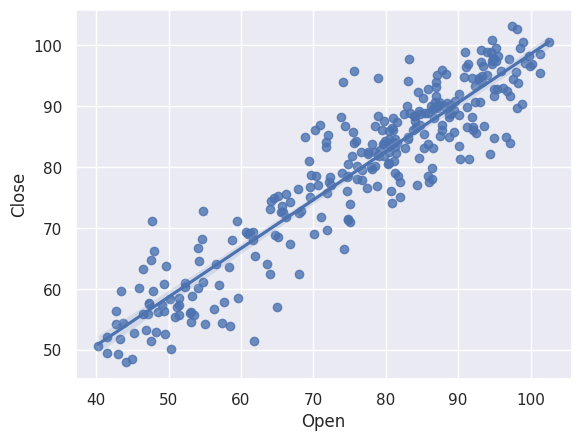

In [13]:
sns.regplot(data=train, x='Open', y='Close', fit_reg=True, scatter=True)

<Axes: xlabel='Open_lag3', ylabel='Close'>

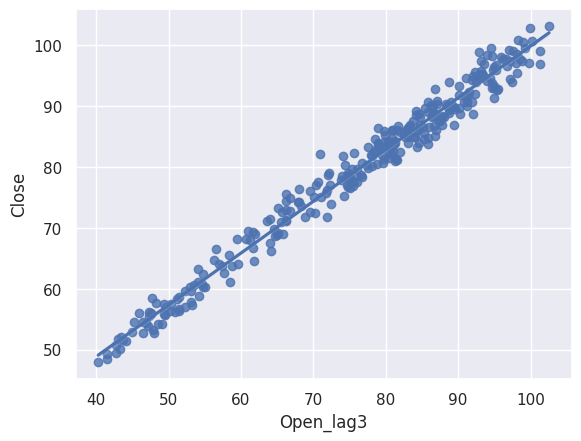

In [14]:
sns.regplot(data=train, x='Open_lag3', y='Close', fit_reg=True, scatter=True)

<Axes: xlabel='SMA_5_Open', ylabel='Close'>

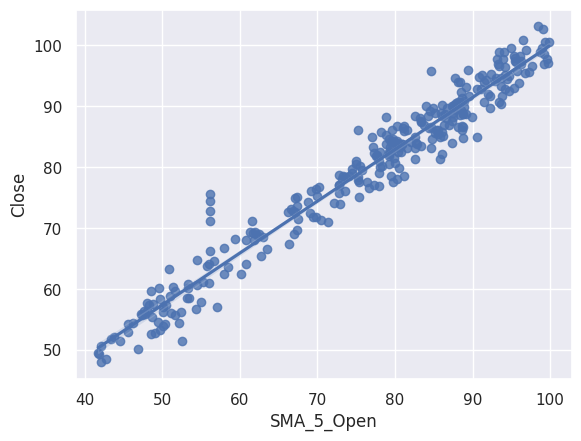

In [15]:
sns.regplot(data=train, x='SMA_5_Open', y='Close', fit_reg=True, scatter=True)

/opt/conda/lib/python3.10/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


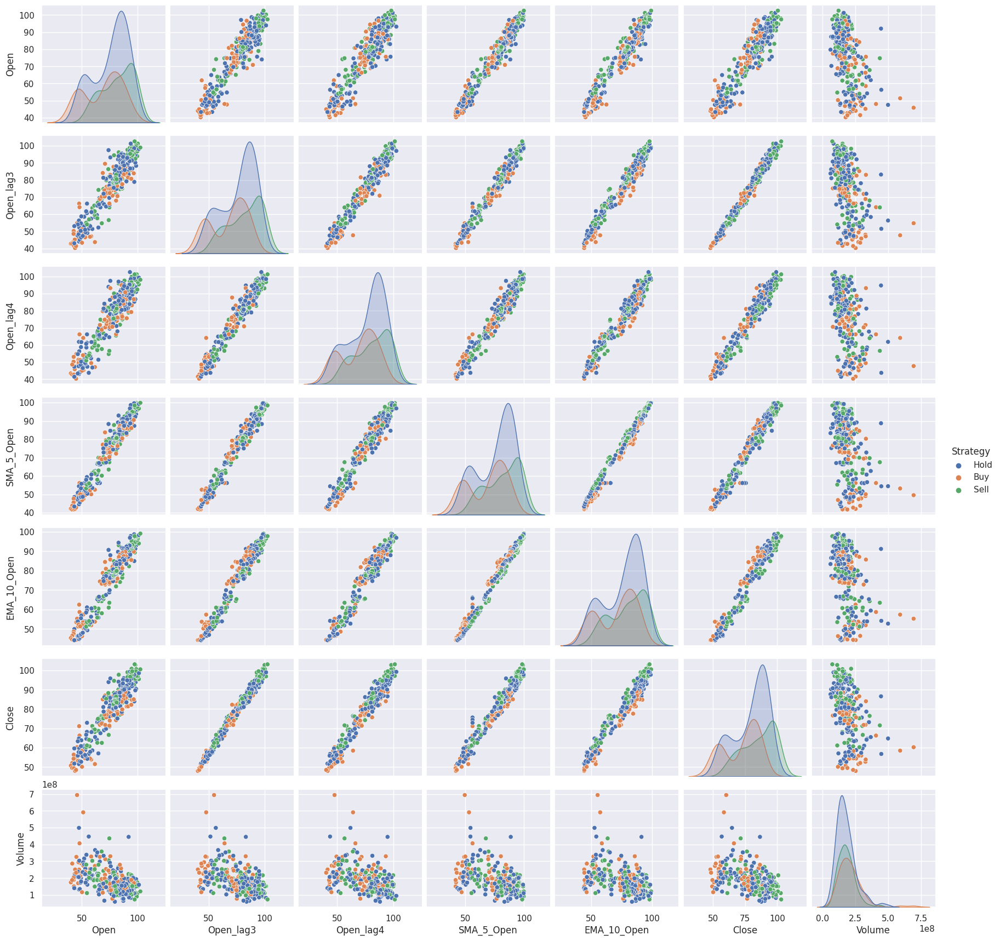

In [16]:
sns.pairplot(train.loc[:,['Open','Open_lag3','Open_lag4','SMA_5_Open','EMA_10_Open','Close','Volume','Strategy']], hue="Strategy")

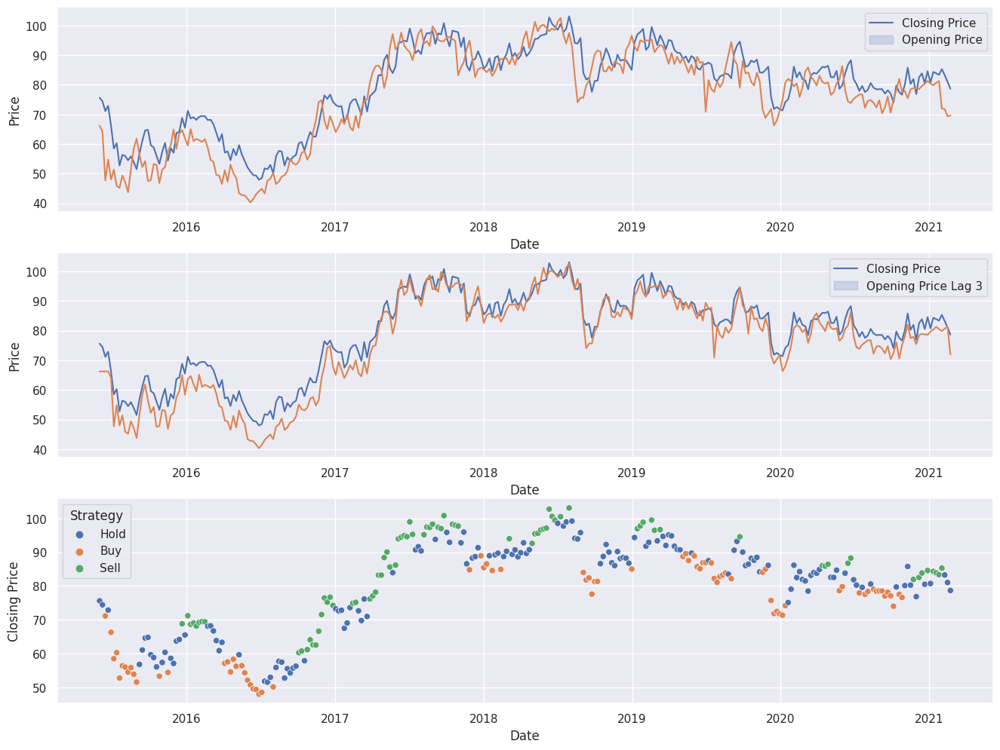

In [17]:
# Create a Matplotlib figure and axis
fig, axes = plt.subplots(3,1,figsize=(16, 12))
# Plot the first lineplot
sns.lineplot(x=train.index, y="Close", data=train, ax=axes[0],)
sns.lineplot(x=train.index, y="Open", data=train, ax=axes[0])
axes[0].legend(labels=['Closing Price','Opening Price'])
axes[0].set_ylabel('Price')


sns.lineplot(x=train.index, y="Close", data=train, ax=axes[1])
sns.lineplot(x=train.index, y="Open_lag3", data=train, ax=axes[1])
axes[1].legend(labels=['Closing Price','Opening Price Lag 3'])
axes[1].set_ylabel('Price')
# Plot the second lineplot with hue
sns.scatterplot(x=train.index, y="Close", hue="Strategy", data=train, ax=axes[2])
axes[2].legend(title="Strategy")
axes[2].set_ylabel('Closing Price')
# fig.tight_layout()
plt.show()

### The plot suggests a common trading strategy where stocks are sold when closing prices are high and bought when closing prices are low. This approach is often referred to as a "buy low, sell high" strategy, and it aims to maximize profits by purchasing stocks at lower prices and selling them when prices are higher.

 # Decomposing closing stock price

In [18]:
from statsmodels.tsa.seasonal import seasonal_decompose
def decompose(data):
    ss_decomposition = seasonal_decompose(x=data, model='additive')
    estimated_trend = ss_decomposition.trend
    estimated_seasonal = ss_decomposition.seasonal
    estimated_residual = ss_decomposition.resid

    fig, axes = plt.subplots(4, 1, sharex=True, sharey=False)
    fig.set_figheight(10)
    fig.set_figwidth(15)

    axes[0].plot(data, label='Original')
    axes[0].legend(loc='upper left');

    axes[1].plot(estimated_trend, label='Trend')
    axes[1].legend(loc='upper left');

    axes[2].plot(estimated_seasonal, label='Seasonality')
    axes[2].legend(loc='upper left');

    axes[3].plot(estimated_residual, label='Residuals')
    axes[3].legend(loc='upper left');

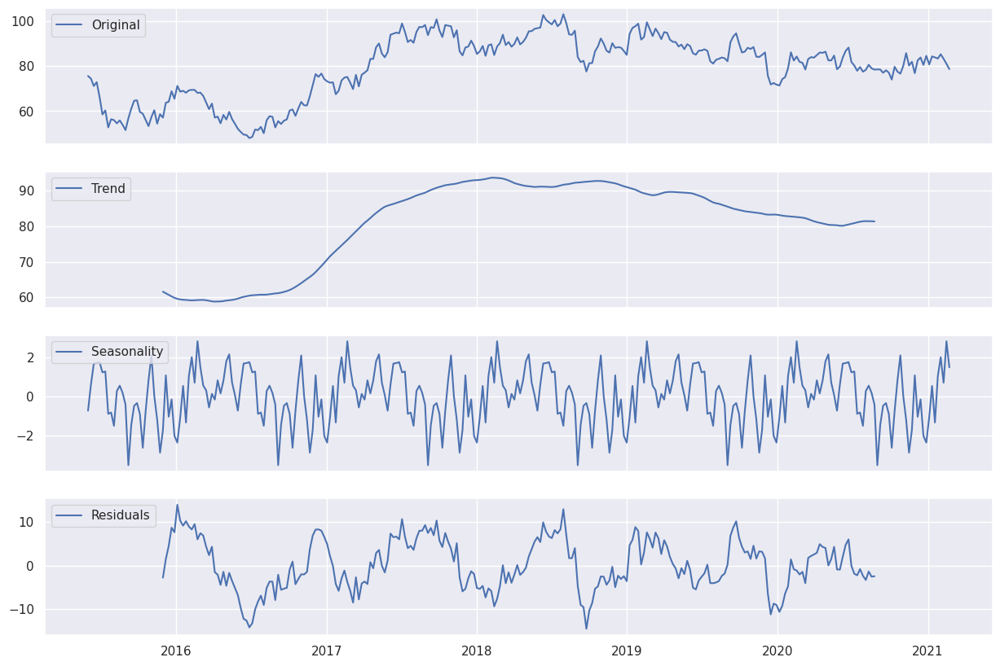

In [19]:
decompose(train['Close'])

### We can see that the Closing price data is not stationary and contains both trend and seasonality

<Axes: xlabel='Strategy'>

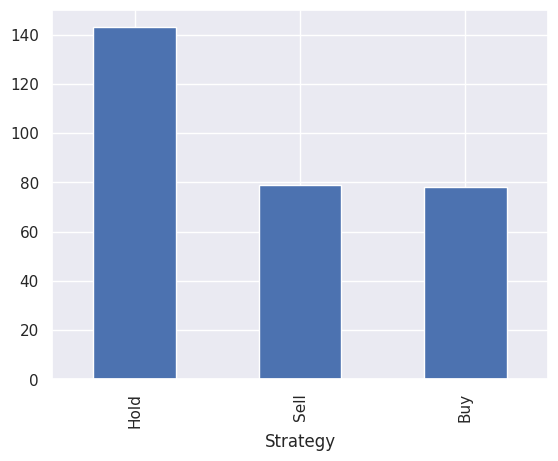

In [20]:
train['Strategy'].value_counts().plot.bar()

There is an imbalance in the number of data points for the "hold" class, which contains nearly twice as many data points as the "sell" and "buy" classes.

We can handle Class Imbalance by:

1. **Resampling**: To address the class imbalance issue, you can resample the dataset. There are two common techniques:
   - **Oversampling**: Increase the number of samples in the minority classes (e.g., "sell" and "buy") by duplicating or generating synthetic samples.
   - **Undersampling**: Decrease the number of samples in the majority class (e.g., "hold") by randomly removing instances.

2. **Collect More Data**: If possible, collect more data for the minority classes to balance the dataset. This may not always be feasible but can be an effective solution.

3. **Synthetic Data Generation**: You can use techniques like Synthetic Minority Over-sampling Technique (SMOTE) to generate synthetic samples for the minority classes.

4. **Different Algorithms**: Some machine learning algorithms handle class imbalances better than others. Experiment with different algorithms and ensemble methods that can handle imbalanced datasets.

5. **Class-Weighted Loss**: Modify the loss function in your machine learning algorithm to assign higher weights to misclassifications in the minority classes. This informs the algorithm that errors in minority classes are more costly.

6. **Evaluation Metrics**: When evaluating the model, use metrics that are less sensitive to class imbalance, such as precision, recall, F1-score, or area under the Receiver Operating Characteristic (ROC-AUC).

7. **Cross-Validation**: Use stratified cross-validation techniques to ensure that each fold of the data contains a proportional representation of each class.

8. **Ensemble Methods**: Combine multiple models using ensemble techniques like bagging or boosting, which can help mitigate class imbalance issues.

# Test for stationarity

### ADF Test
ADF test is conducted with the following assumptions:

- **Null Hypothesis (HO)**: Series is non-stationary, or series has a unit root.
- **Alternate Hypothesis (HA)**: Series is stationary, or series has no unit root.

### KPSS Test
The KPSS test is conducted with the following assumptions:

- **Null Hypothesis (HO)**: Series is trend stationary or series has no unit root.
- **Alternate Hypothesis (HA)**: Series is non-stationary, or series has a unit root.

In [21]:
from statsmodels.tsa.stattools import adfuller, kpss
def adf_test(data):
    print("\nObservations of Dickey-fuller test")
    dftest = adfuller(data, autolag=None)
    dfoutput=pd.Series(dftest[0:4],index=['Test Statistic','p-value','#lags used','number of observations used'])
    for key,value in dftest[4].items():
        dfoutput['critical value (%s)'%key]= value
    print(dfoutput)
    
def kpss_test(data):
    print ('\nResults of KPSS Test:')
    kpsstest = kpss(data, regression='c', nlags="auto")
    kpss_output = pd.Series(kpsstest[0:3], index=['Test Statistic','p-value','#Lags Used'])
    for key,value in kpsstest[3].items():
        kpss_output['Critical Value (%s)'%key] = value
    print (kpss_output)

In [22]:
adf_test(train['Close'])
kpss_test(train['Close'])


Observations of Dickey-fuller test
Test Statistic                  -1.720507
p-value                          0.420579
#lags used                      16.000000
number of observations used    283.000000
critical value (1%)             -3.453670
critical value (5%)             -2.871808
critical value (10%)            -2.572241
dtype: float64

Results of KPSS Test:
Test Statistic            1.300008
p-value                   0.010000
#Lags Used               10.000000
Critical Value (10%)      0.347000
Critical Value (5%)       0.463000
Critical Value (2.5%)     0.574000
Critical Value (1%)       0.739000
dtype: float64


/tmp/ipykernel_20/1320633072.py:12: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpsstest = kpss(data, regression='c', nlags="auto")


### We observe that the data exhibits non-stationarity (we have applied both the Kwiatkowski-Phillips-Schmidt-Shin (KPSS) and Augmented Dickey-Fuller (ADF) tests. These tests help us assess and confirm the non-stationary nature of the data) To make the data stationary, we will proceed with differencing it once.

In [23]:
train['differenced_close'] = train['Close'].diff(1)
train['differenced_close'].head()

Date
2015-06-01         NaN
2015-06-08   -1.166647
2015-06-15   -3.302500
2015-06-22    1.740512
2015-06-29   -6.596626
Name: differenced_close, dtype: float64

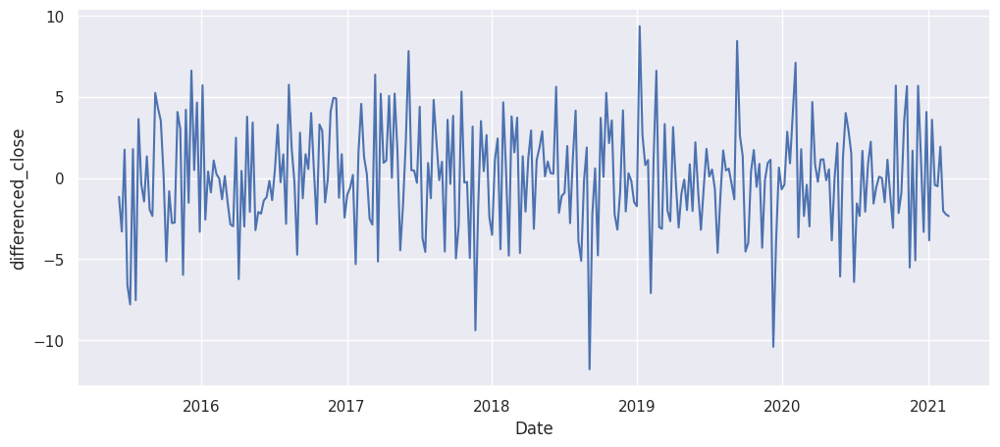

In [24]:
fig, ax = plt.subplots(figsize=(12, 5))
sns.lineplot(x=train.index, y="differenced_close", data=train, ax=ax)
plt.show()

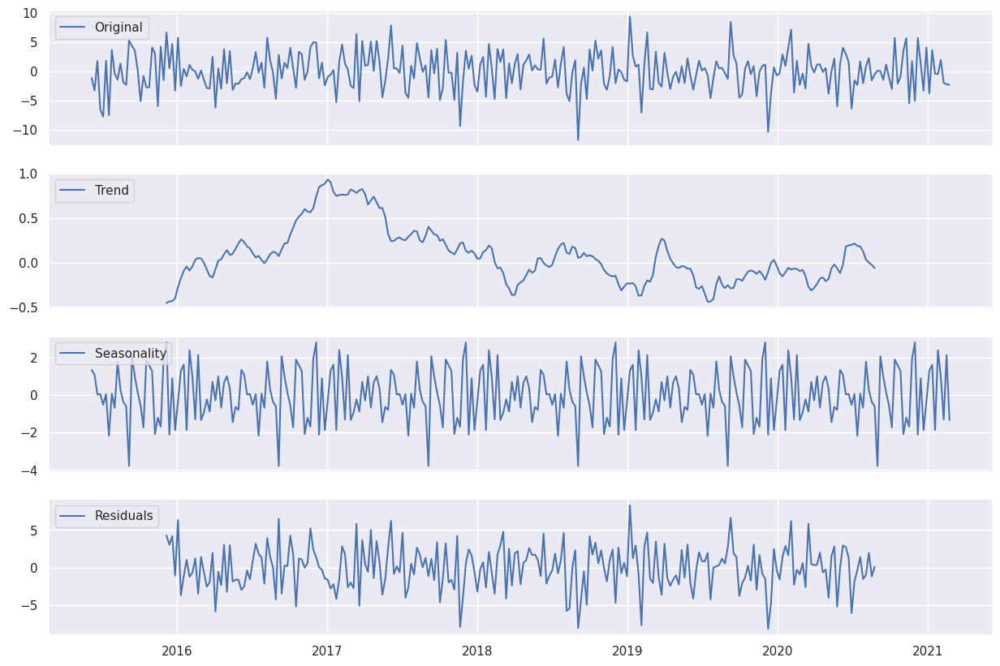

In [25]:
decompose(train['differenced_close'].dropna())

In [26]:
adf_test(train['differenced_close'].dropna())
kpss_test(train['differenced_close'].dropna())


Observations of Dickey-fuller test
Test Statistic                  -4.518303
p-value                          0.000182
#lags used                      16.000000
number of observations used    282.000000
critical value (1%)             -3.453754
critical value (5%)             -2.871844
critical value (10%)            -2.572261
dtype: float64

Results of KPSS Test:
Test Statistic           0.078154
p-value                  0.100000
#Lags Used               5.000000
Critical Value (10%)     0.347000
Critical Value (5%)      0.463000
Critical Value (2.5%)    0.574000
Critical Value (1%)      0.739000
dtype: float64


/tmp/ipykernel_20/1320633072.py:12: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpsstest = kpss(data, regression='c', nlags="auto")


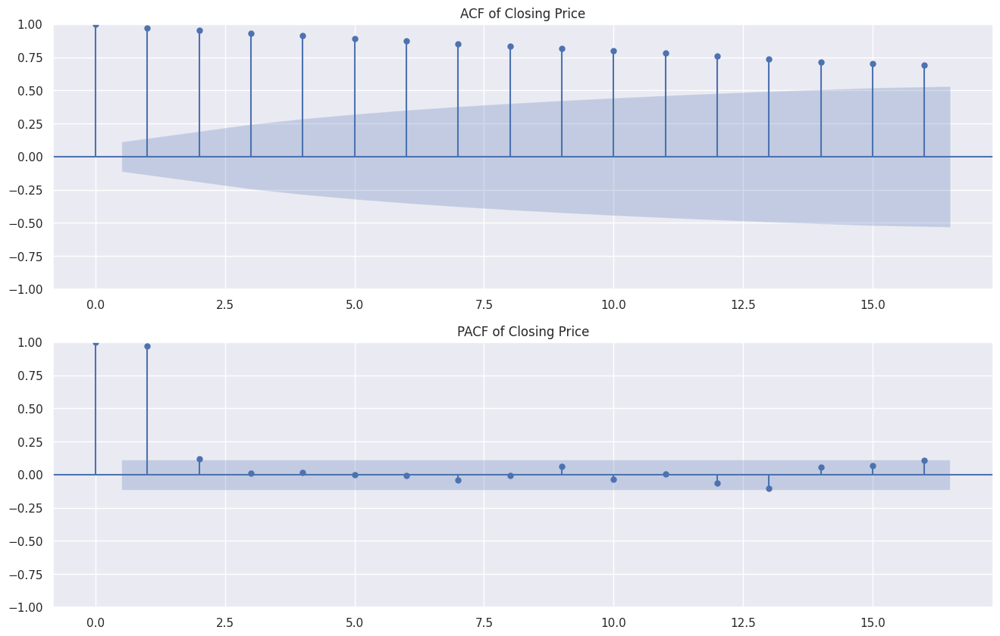

In [27]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
fig, axes = plt.subplots(figsize=(16,10),nrows=2)
plot_acf(train['Close'], lags=16, ax=axes[0])
axes[0].set_title('ACF of Closing Price')
plot_pacf(train['Close'], lags=16, ax=axes[1])
axes[1].set_title('PACF of Closing Price')
plt.show()

### In the Autocorrelation Function (ACF) plot, the significance of lags is observed to exponentially decrease, indicating that each lag is progressively less correlated with the preceding lags. Conversely, in the Partial Autocorrelation Function (PACF) plot, only a single lag appears to be statistically significant, suggesting that most of the correlation with previous lags can be explained by this particular lag.

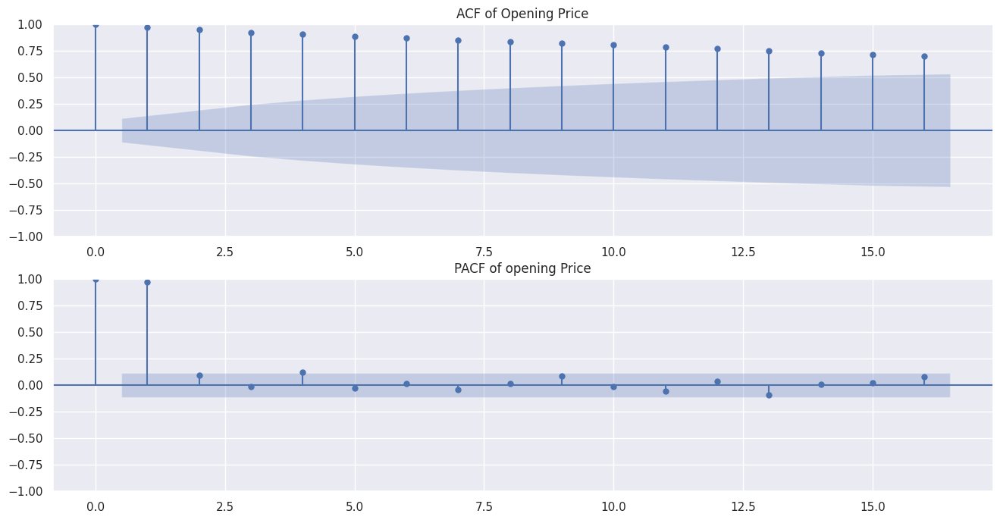

In [28]:
fig, axes = plt.subplots(figsize=(16,8),nrows=2)
plot_acf(train['Open'], lags=16, ax=axes[0])
axes[0].set_title('ACF of Opening Price')
plot_pacf(train['Open'], lags=16, ax=axes[1])
axes[1].set_title('PACF of opening Price')
plt.show()

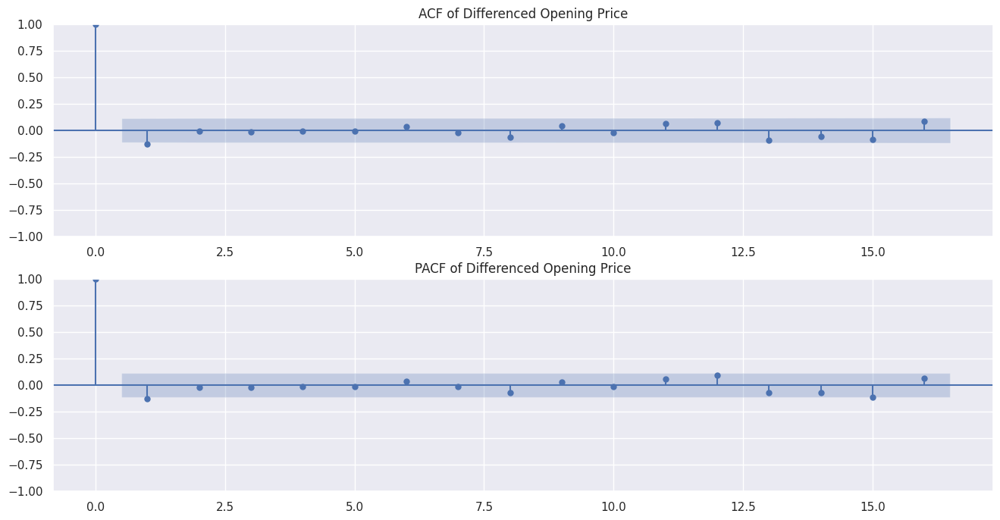

In [29]:
fig, axes = plt.subplots(figsize=(16,8),nrows=2)
plot_acf(train['differenced_close'].dropna(), lags=16, ax=axes[0])
axes[0].set_title('ACF of Differenced Opening Price')
plot_pacf(train['differenced_close'].dropna(), lags=16, ax=axes[1])
axes[1].set_title('PACF of Differenced Opening Price')
plt.show()

### As differencing the time series data doesn't reveal any significant lags in either the ACF or PACF plots, it suggests that the data is already stationary, and no further differencing is necessary.


Observations of Dickey-fuller test
Test Statistic                  -4.012117
p-value                          0.001348
#lags used                      16.000000
number of observations used    283.000000
critical value (1%)             -3.453670
critical value (5%)             -2.871808
critical value (10%)            -2.572241
dtype: float64

Results of KPSS Test:
Test Statistic           0.022102
p-value                  0.100000
#Lags Used               8.000000
Critical Value (10%)     0.347000
Critical Value (5%)      0.463000
Critical Value (2.5%)    0.574000
Critical Value (1%)      0.739000
dtype: float64


/tmp/ipykernel_20/1320633072.py:12: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpsstest = kpss(data, regression='c', nlags="auto")


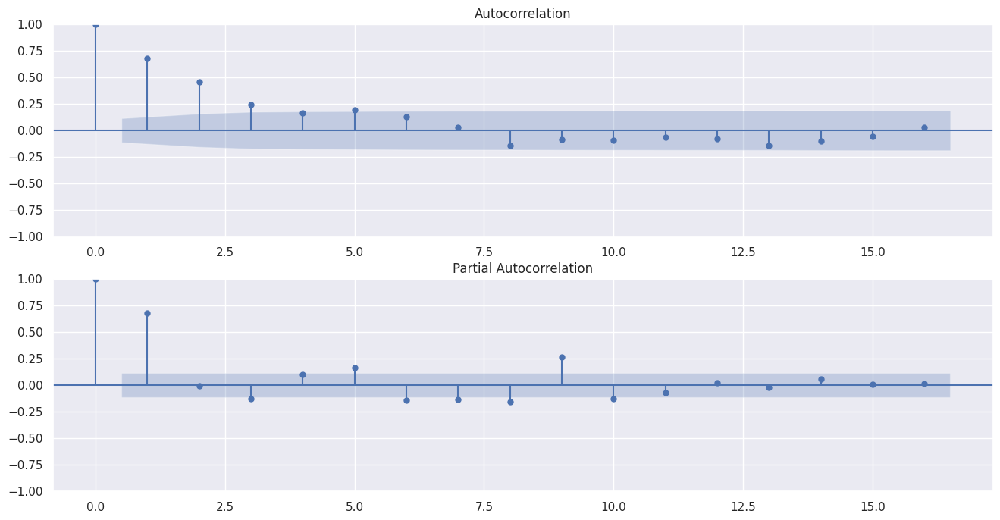

In [30]:
result = seasonal_decompose(train['Close'], model='additive',extrapolate_trend='freq')
adf_test(result.seasonal)
kpss_test(result.seasonal)
fig, axes = plt.subplots(figsize=(16,8),nrows=2)
plot_acf(result.seasonal, lags=16, ax=axes[0])
plot_pacf(result.seasonal, lags=16, ax=axes[1])
plt.show()

# Test Train Split

In [31]:
train.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 300 entries, 2015-06-01 to 2021-02-22
Data columns (total 31 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   id                  300 non-null    int64  
 1   Open                300 non-null    float64
 2   Close               300 non-null    float64
 3   Volume              300 non-null    int64  
 4   Strategy            300 non-null    object 
 5   Lag_1               300 non-null    float64
 6   Open_lag            300 non-null    float64
 7   Open_lag2           300 non-null    float64
 8   Open_lag3           300 non-null    float64
 9   Open_lag4           300 non-null    float64
 10  Open_MA_20          300 non-null    float64
 11  Volume_MA_20        300 non-null    float64
 12  Open_Volatility     300 non-null    float64
 13  Weekly_Return       300 non-null    float64
 14  Volume_Lag1         300 non-null    float64
 15  Volume_Rolling_Std  300 non-null    fl

# Selecting Best Features

- "SelectKBest" uses a scoring function to assess the importance of each feature. Common scoring functions include:

- f_classif: Computes the ANOVA F-statistic for a classification task, measuring the difference in means between classes.
- f_regression: Measures the linear relationship between each feature and the target variable in a regression task.

In [32]:
# selecting best features
from sklearn.feature_selection import SelectKBest, f_regression
# Define the number of top features to select
k = 3  # Adjust the number of features as needed

# Create a SelectKBest feature selector using the F-test (ANOVA) statistic
feature_selector = SelectKBest(score_func=f_regression, k=k)

# Fit the feature selector to your training data
X_train_selected = feature_selector.fit_transform(train[['Open','Open_lag2','Open_lag3','Open_lag4','Open_lag', 'Open_MA_20', 'Volume_MA_20', 'Open_Volatility', 'Weekly_Return', 'Volume_Lag1', 'Volume_Rolling_Std', 'Price_Change', 'Volume_Change', 'SMA_5_Open', 'SMA_10_Open', 'SMA_20_Open', 'SMA_5_Volume', 'SMA_10_Volume', 'SMA_20_Volume','EMA_5_Open', 'EMA_10_Open','EMA_20_Open', 'EMA_5_Volume', 'EMA_10_Volume', 'EMA_20_Volume']], train['Close'])
# Get the selected feature indices
selected_feature_indices = feature_selector.get_support(indices=True)

# Print the indices of the selected features
print("Selected Feature Indices:", selected_feature_indices)
X = train[['Open','Open_lag2','Open_lag3','Open_lag4','Open_lag', 'Open_MA_20', 'Volume_MA_20', 'Open_Volatility', 'Weekly_Return', 'Volume_Lag1', 'Volume_Rolling_Std', 'Price_Change', 'Volume_Change', 'SMA_5_Open', 'SMA_10_Open', 'SMA_20_Open', 'SMA_5_Volume', 'SMA_10_Volume', 'SMA_20_Volume','EMA_5_Open', 'EMA_10_Open','EMA_20_Open', 'EMA_5_Volume', 'EMA_10_Volume', 'EMA_20_Volume']]
# Use the selected features for predicting the closing price
selected_features = X.columns[selected_feature_indices]
print(selected_features)

Selected Feature Indices: [ 2 13 20]
Index(['Open_lag3', 'SMA_5_Open', 'EMA_10_Open'], dtype='object')


In [33]:
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.datasets import load_iris
from sklearn.feature_selection import SelectFromModel

# Create an ExtraTreesClassifier model
reg = ExtraTreesRegressor(n_estimators=50)
reg = reg.fit(train[['Open','Open_lag2','Open_lag3','Open_lag4','Open_lag', 'Open_MA_20', 'Volume_MA_20', 'Open_Volatility', 'Weekly_Return', 'Volume_Lag1', 'Volume_Rolling_Std', 'Price_Change', 'Volume_Change', 'SMA_5_Open', 'SMA_10_Open', 'SMA_20_Open', 'SMA_5_Volume', 'SMA_10_Volume', 'SMA_20_Volume','EMA_5_Open', 'EMA_10_Open','EMA_20_Open', 'EMA_5_Volume', 'EMA_10_Volume', 'EMA_20_Volume']], train['Close'])

# Get feature importances from the classifier
feature_importances = reg.feature_importances_

# Create a SelectFromModel instance and transform the data to select important features
model = SelectFromModel(reg, prefit=True, max_features=4)
X_new = model.transform(train[['Open','Open_lag2','Open_lag3','Open_lag4','Open_lag', 'Open_MA_20', 'Volume_MA_20', 'Open_Volatility', 'Weekly_Return', 'Volume_Lag1', 'Volume_Rolling_Std', 'Price_Change', 'Volume_Change', 'SMA_5_Open', 'SMA_10_Open', 'SMA_20_Open', 'SMA_5_Volume', 'SMA_10_Volume', 'SMA_20_Volume','EMA_5_Open', 'EMA_10_Open','EMA_20_Open', 'EMA_5_Volume', 'EMA_10_Volume', 'EMA_20_Volume']])

X = train[['Open','Open_lag2','Open_lag3','Open_lag4','Open_lag', 'Open_MA_20', 'Volume_MA_20', 'Open_Volatility', 'Weekly_Return', 'Volume_Lag1', 'Volume_Rolling_Std', 'Price_Change', 'Volume_Change', 'SMA_5_Open', 'SMA_10_Open', 'SMA_20_Open', 'SMA_5_Volume', 'SMA_10_Volume', 'SMA_20_Volume','EMA_5_Open', 'EMA_10_Open','EMA_20_Open', 'EMA_5_Volume', 'EMA_10_Volume', 'EMA_20_Volume']]

# Get the selected feature columns
selected_feature_indices = model.get_support(indices=True)
selected_features = X.columns[selected_feature_indices]

# Print the selected feature columns
print("Selected Feature Columns:")
print(selected_features)

Selected Feature Columns:
Index(['Open_lag3', 'Open_lag4', 'SMA_5_Open', 'EMA_20_Open'], dtype='object')


/opt/conda/lib/python3.10/site-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


# Creating ARIMAX Model

In [34]:
from sklearn.model_selection import TimeSeriesSplit
from sklearn.preprocessing import RobustScaler

ts_selected_features = ['Open','Open_lag2', 'Open_lag3', 'SMA_5_Open', 'EMA_5_Open','EMA_10_Open']
tss = TimeSeriesSplit(n_splits=2, test_size=int(len(train) * 0.2))
ts_scaler = RobustScaler()
X = train[ts_selected_features]
y = train.loc[:, 'Close']
for train_index, test_index in tss.split(X):
    X_train, X_test = X.iloc[train_index, :],  X.iloc[test_index,:]
    # X_train, X_test = create_features_ts(X.iloc[train_index, :])[ts_selected_features], created_features_ts(X.iloc[test_index,:])[ts_selected_features]
    display(X_train.head())
    display(X_test.head())
    X_train = ts_scaler.fit_transform(X_train)
    X_test = ts_scaler.transform(X_test)
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

display(y_train.head())
print(f"Number of training samples: {len(X_train)}, Number of validation samples: {len(X_test)}")

,Open,Open_lag2,Open_lag3,SMA_5_Open,EMA_5_Open,EMA_10_Open
Date,,,,,,
2015-06-01,66.208486,66.208486,66.208486,56.162676,66.208486,66.208486
2015-06-08,64.116235,66.208486,66.208486,56.162676,65.511069,65.828077
2015-06-15,47.701942,66.208486,66.208486,56.162676,59.574693,62.532416
2015-06-22,54.754816,64.116235,66.208486,56.162676,57.968068,61.118307
2015-06-29,48.031899,47.701942,64.116235,56.162676,54.656012,58.738960


,Open,Open_lag2,Open_lag3,SMA_5_Open,EMA_5_Open,EMA_10_Open
Date,,,,,,
2018-11-12,84.719370,84.464655,84.721356,86.286522,85.775523,86.134355
2018-11-19,87.785787,86.241775,84.464655,85.586589,86.445611,86.434616
2018-11-26,87.294092,84.719370,86.241775,86.101136,86.728438,86.590884
2018-12-03,86.728524,87.785787,84.719370,86.553910,86.728467,86.615909
2018-12-10,83.891013,87.294092,87.785787,86.083757,85.782649,86.120474


,Open,Open_lag2,Open_lag3,SMA_5_Open,EMA_5_Open,EMA_10_Open
Date,,,,,,
2015-06-01,66.208486,66.208486,66.208486,56.162676,66.208486,66.208486
2015-06-08,64.116235,66.208486,66.208486,56.162676,65.511069,65.828077
2015-06-15,47.701942,66.208486,66.208486,56.162676,59.574693,62.532416
2015-06-22,54.754816,64.116235,66.208486,56.162676,57.968068,61.118307
2015-06-29,48.031899,47.701942,64.116235,56.162676,54.656012,58.738960


,Open,Open_lag2,Open_lag3,SMA_5_Open,EMA_5_Open,EMA_10_Open
Date,,,,,,
2020-01-06,74.811495,67.967818,66.278431,70.401448,71.794247,73.235150
2020-01-13,80.812144,71.108020,67.967818,72.195581,74.800212,74.612786
2020-01-20,82.002162,74.811495,71.108020,75.340328,77.200862,75.956309
2020-01-27,81.211918,80.812144,74.811495,77.989148,78.537881,76.911874
2020-02-03,79.468382,82.002162,80.812144,79.661220,78.848048,77.376693


Date
2015-06-01    75.609978
2015-06-08    74.443331
2015-06-15    71.140831
2015-06-22    72.881344
2015-06-29    66.284718
Name: Close, dtype: float64

Number of training samples: 240, Number of validation samples: 60


In [35]:
import statsmodels.api as sm
exog=sm.add_constant(X_train)

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=1261.014, Time=0.83 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=1256.013, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=1255.434, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=1255.332, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=1254.019, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=1257.270, Time=0.10 sec

Best model:  ARIMA(0,1,0)(0,0,0)[0]          
Total fit time: 1.229 seconds


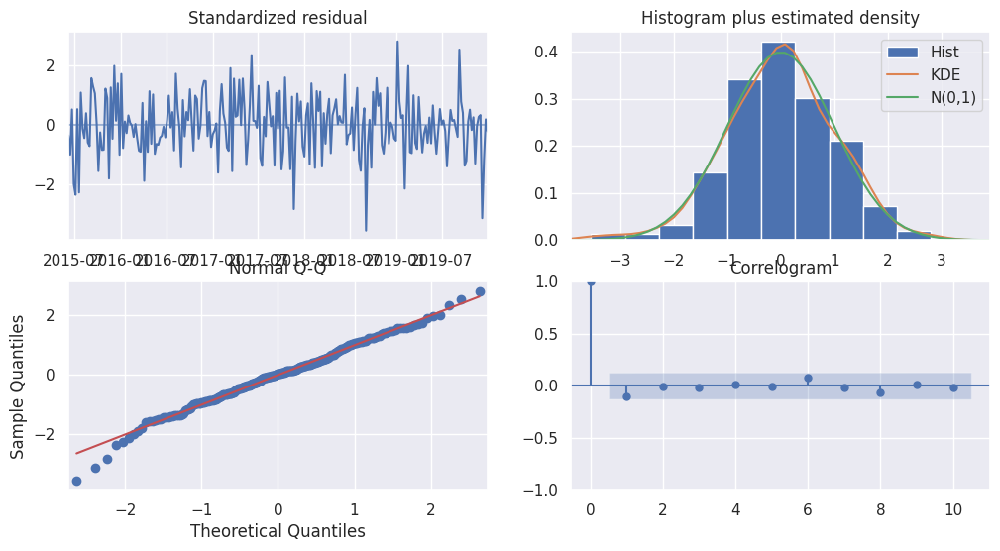

In [36]:
from pmdarima.arima import auto_arima
model = auto_arima(y_train, exogenous=exog, trace=True, error_action="ignore", suppress_warnings=True)
model_fit = model.fit(y_train, exogenous=X_train)
model_fit.summary()
model_fit.plot_diagnostics(figsize=(12,6));

In [37]:
# Define the SARIMA model with appropriate orders
order = (1, 0, 1)
seasonal_order = (1, 0, 0, 4)

# Fit the SARIMA model to the training data
model = sm.tsa.SARIMAX(y_train, exog=exog, order=order, seasonal_order=seasonal_order)

results = model.fit()
results.summary()

/opt/conda/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-MON will be used.
  self._init_dates(dates, freq)
/opt/conda/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-MON will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.04201D+00    |proj g|=  1.21414D-02

At iterate    5    f=  2.04172D+00    |proj g|=  3.07894D-03

At iterate   10    f=  2.04045D+00    |proj g|=  2.74306D-03

At iterate   15    f=  2.04037D+00    |proj g|=  5.47743D-04

At iterate   20    f=  2.04034D+00    |proj g|=  1.87477D-03

At iterate   25    f=  2.04033D+00    |proj g|=  5.21576D-04

At iterate   30    f=  2.04031D+00    |proj g|=  7.80021D-04

At iterate   35    f=  2.04029D+00    |proj g|=  2.51589D-04

At iterate   40    f=  2.04025D+00    |proj g|=  1.59070D-03

At iterate   45    f=  2.04021D+00    |proj g|=  3.04957D-04

At iterate   50    f=  2.04016D+00    |proj g|=  2.08278D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

/opt/conda/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                              Close   No. Observations:                  240
Model:             SARIMAX(1, 0, 1)x(1, 0, [], 4)   Log Likelihood                -489.638
Date:                            Sat, 04 Nov 2023   AIC                           1001.276
Time:                                    07:09:19   BIC                           1039.563
Sample:                                06-01-2015   HQIC                          1016.703
                                     - 12-30-2019                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         84.4155      0.237    356.709      0.000      83.952      84.879
x1            -8.1878      2.586     -3.166      0.002     -13.257      -3.119
x2            -0.3568      1.738     -0.205      0.837      -3.762       3.049
x3            19.5388      1.219     16.035      0.000      17.151      21.927
x4            -3.3558      2.688     -1.249      0.212      -8.624       1.912
x5            24.2563      7.635      3.177      0.001       9.292      39.220
x6            -5.1328      3.163     -1.623      0.105     -11.333       1.067
ar.L1          0.5926      0.670      0.884      0.377      -0.721       1.907
ma.L1         -0.5332      0.703     -0.759      0.448      -1.911       0.844
ar.S.L4       -0.0097      0.076     -0.128      0.898      -0.159       0.139
sigma2         3.4720      0.373      9.311      0.000       2.741       4.203
===================================================================================
Ljung-Box (L1) (Q):                   0.07   Jarque-Bera (JB):                 3.28
Prob(Q):                              0.79   Prob(JB):                         0.19
Heteroskedasticity (H):               1.77   Skew:                             0.17
Prob(H) (two-sided):                  0.01   Kurtosis:                         2.55
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [38]:
# Ljung Box Test
sm.stats.acorr_ljungbox(results.resid, lags=[10], return_df=True)

,lb_stat,lb_pvalue
10,9.146334,0.518275


In [39]:
# Forecast future values (specify the number of periods to forecast)
forecast_periods = len(X_test)  # You can change this to the number of periods you want to forecast
forecast = results.get_forecast(steps=forecast_periods, exog=sm.add_constant(X_test))

# Extract the predicted values and associated confidence intervals
predicted_values = forecast.predicted_mean
conf_int = forecast.conf_int()

In [40]:
from sklearn.metrics import mean_squared_error
def evaluate_ts(actual, forecast):
    actual = np.array(actual)
    forecast = np.array(forecast)
    
    # Calculate the absolute percentage errors
    absolute_errors = np.abs(actual - forecast)
    absolute_percentage_errors = (absolute_errors / (np.abs(actual) + np.abs(forecast))) * 2.0
    
    # Calculate the mean of the absolute percentage errors
    smape_value = np.mean(absolute_percentage_errors) * 100
    
    metrics = pd.Series([smape_value, mean_squared_error(y_test, predicted_values), np.sqrt(mean_squared_error(y_test, predicted_values))], index=['SMAPE', 'MSE', "RMSE"])
    print("Model Performance")
    display(metrics)

In [41]:
evaluate_ts(y_test, predicted_values)

Model Performance


SMAPE    1.629423
MSE      2.521008
RMSE     1.587768
dtype: float64

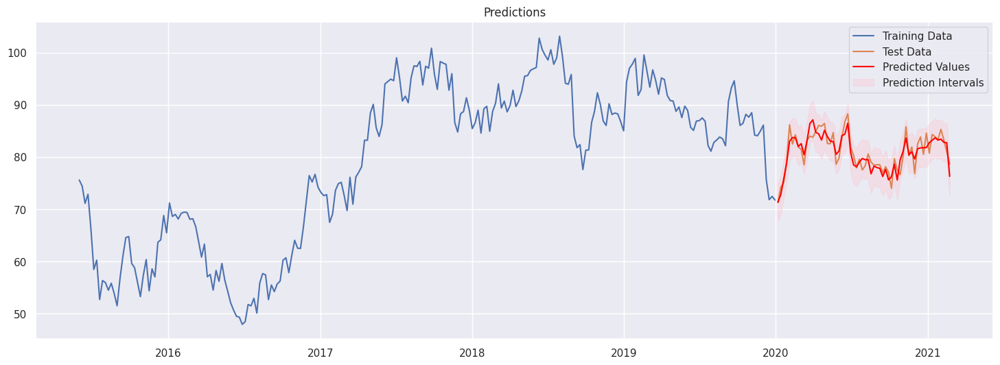

In [42]:
# Plot the original data
fig, ax = plt.subplots(figsize=(18,6))
ax.plot(y_train, label='Training Data')
ax.plot(y_test, label='Test Data')

# Plot the predicted values
ax.plot(predicted_values, color='red', label='Predicted Values')
ax.set_title('Predictions')
# Plot the prediction intervals (optional)
ax.fill_between(conf_int.index, conf_int.iloc[:, 0], conf_int.iloc[:, 1], color='pink', alpha=0.3, label='Prediction Intervals')

ax.legend()
plt.show()

# Classifier

## EDA

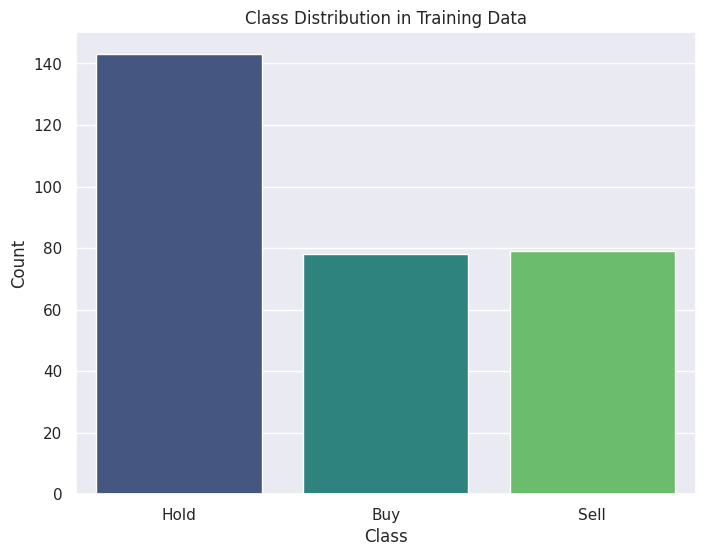

In [43]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming you have a DataFrame 'df_train' with the training data
# and the target variable is named 'class'

# Replace 'class' with the actual name of your target variable
class_distribution = train['Strategy'].value_counts()

# Plot the class distribution
plt.figure(figsize=(8, 6))
sns.countplot(x='Strategy', data=train, palette='viridis')
plt.title('Class Distribution in Training Data')
plt.xlabel('Class')
plt.ylabel('Count')
plt.show()

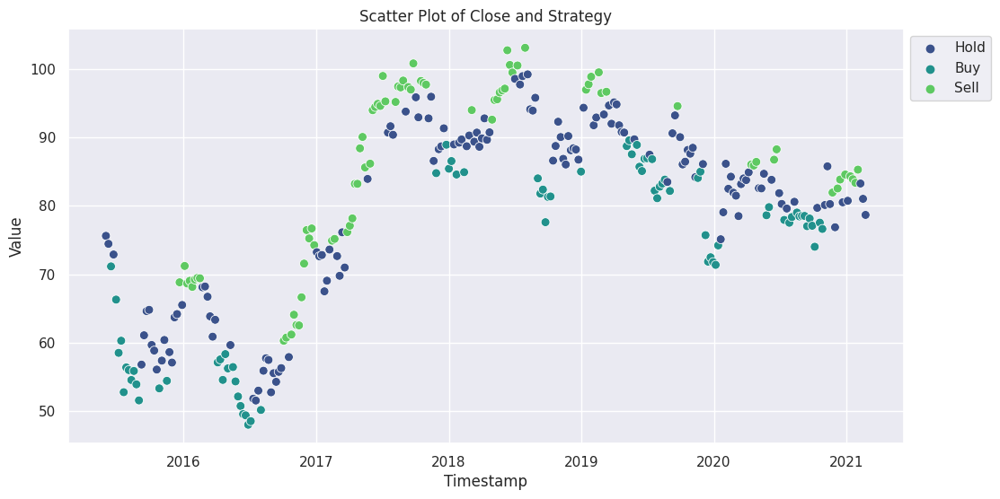

In [44]:
# Assuming you have a DataFrame 'train' with columns 'Close' and 'Strategy'
# Make sure that the index of the DataFrame is the timestamp

# Set up the figure and axis
plt.figure(figsize=(12, 6))

# Scatter plot for 'Close' and 'Strategy' with different colors for each strategy
sns.scatterplot(x=train.index, y=train['Close'], hue=train['Strategy'], palette='viridis', s=50)

# Add labels and title
plt.xlabel('Timestamp')
plt.ylabel('Value')
plt.title('Scatter Plot of Close and Strategy')

# Show the legend outside the plot for clarity
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))

# Show the plot
plt.show()

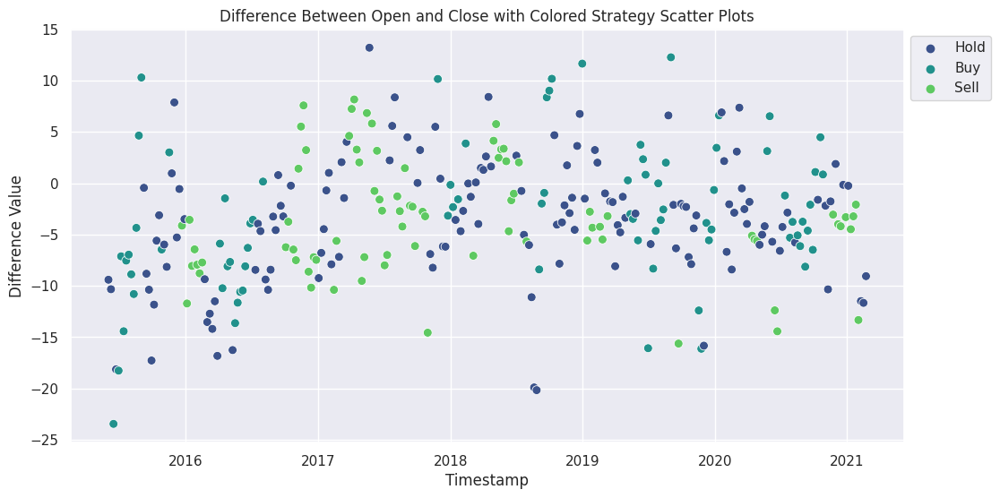

In [45]:
import seaborn as sns
# Assuming you have a DataFrame 'train' with columns 'Open', 'Close', and 'Strategy'
# Make sure that the index of the DataFrame is the timestamp

# Calculate the differences between 'Open' and 'Close'
train['Open_Close_Difference'] = train['Open'] - train['Close']

# Set up the figure and axis
plt.figure(figsize=(12, 6))

# Scatter plot for 'Open_Close_Difference' and 'Strategy' with different colors for each strategy
sns.scatterplot(x=train.index, y=train['Open_Close_Difference'], hue=train['Strategy'], palette='viridis', s=50)

# Add labels and title
plt.xlabel('Timestamp')
plt.ylabel('Difference Value')
plt.title('Difference Between Open and Close with Colored Strategy Scatter Plots')

# Show the legend outside the plot for clarity
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))

# Show the plot
plt.show()

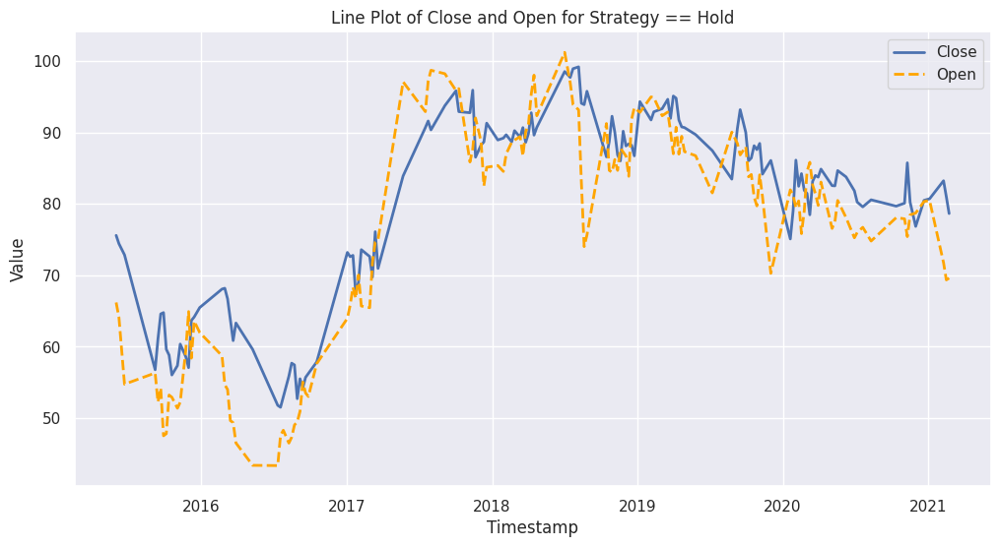

In [46]:
# Filter the DataFrame for rows where the strategy is 'Hold'
hold_data = train[train['Strategy'] == 'Hold']

# Set up the figure and axis
plt.figure(figsize=(12, 6))

# Line plot for 'Close' when strategy is 'Hold'
plt.plot(hold_data.index, hold_data['Close'], label='Close', linewidth=2)

# Line plot for 'Open' when strategy is 'Hold'
plt.plot(hold_data.index, hold_data['Open'], label='Open', linestyle='--', color='orange', linewidth=2)

# Add labels and title
plt.xlabel('Timestamp')
plt.ylabel('Value')
plt.title('Line Plot of Close and Open for Strategy == Hold')

# Show the legend
plt.legend()

# Show the plot
plt.show()

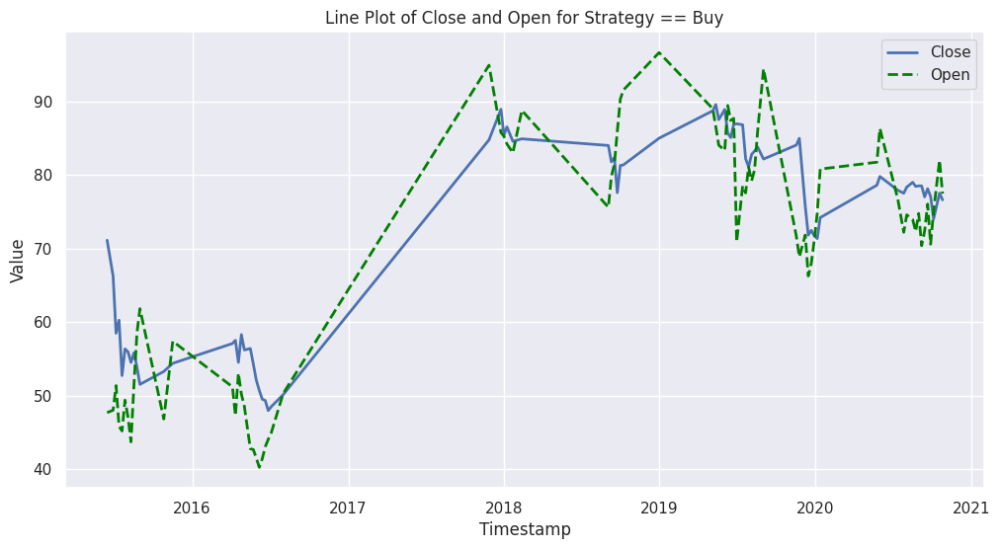

In [47]:
# Filter the DataFrame for rows where the strategy is 'Hold'
hold_data = train[train['Strategy'] == 'Buy']

# Set up the figure and axis
plt.figure(figsize=(12, 6))

# Line plot for 'Close' when strategy is 'Hold'
plt.plot(hold_data.index, hold_data['Close'], label='Close', linewidth=2)

# Line plot for 'Open' when strategy is 'Hold'
plt.plot(hold_data.index, hold_data['Open'], label='Open', linestyle='--', color='green', linewidth=2)

# Add labels and title
plt.xlabel('Timestamp')
plt.ylabel('Value')
plt.title('Line Plot of Close and Open for Strategy == Buy')

# Show the legend
plt.legend()

# Show the plot
plt.show()

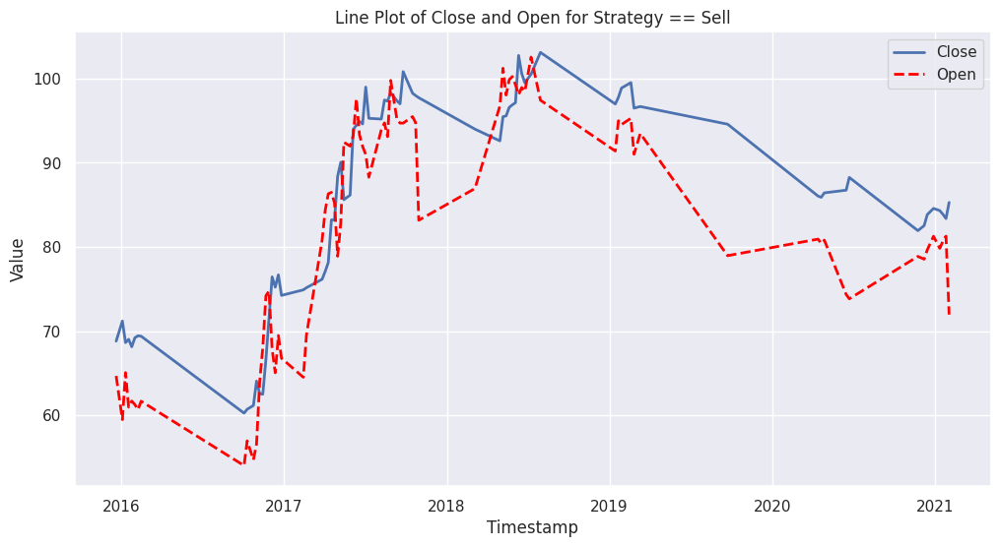

In [48]:
hold_data = train[train['Strategy'] == 'Sell']

# Set up the figure and axis
plt.figure(figsize=(12, 6))

# Line plot for 'Close' when strategy is 'Hold'
plt.plot(hold_data.index, hold_data['Close'], label='Close', linewidth=2)

# Line plot for 'Open' when strategy is 'Hold'
plt.plot(hold_data.index, hold_data['Open'], label='Open', linestyle='--', color='red', linewidth=2)

# Add labels and title
plt.xlabel('Timestamp')
plt.ylabel('Value')
plt.title('Line Plot of Close and Open for Strategy == Sell')

# Show the legend
plt.legend()

# Show the plot
plt.show()

# Feature Engineering for Classification

1. **Open**: The opening price of the stock. It can provide information about the initial market sentiment and is essential for calculating various technical indicators.

2. **Close**: The closing price of the stock, which is a key factor in determining the strategy as it reflects the final price at which a trade occurs.

3. **Volume**: The total number of shares traded during a given period. High trading volumes can indicate increased investor interest.

4. **Lag_1**: The lagged (previous) value of the closing price. It can help capture short-term trends in the stock price.

5. **Lag_2**: A further lagged value of the closing price, providing additional historical context for price movements.

6. **Close_diff**: The difference between the current closing price and the previous closing price. It can help identify price changes.

7. **SMA_5 (Simple Moving Average, 5-day)**: It calculates the average stock price over the last 5 days. SMA is used to identify short-term trends.

8. **STD_5 (Standard Deviation, 5-day)**: It measures price volatility over the last 5 days. High volatility may be associated with speculative trading.

9. **SMA_13**: The 13-day Simple Moving Average. It helps in identifying medium-term trends.

10. **SMA_20**: The 20-day Simple Moving Average. It's often used as a support or resistance level.

11. **SMA_50**: The 50-day Simple Moving Average. It's a common indicator for long-term trends.

12. **RSI (Relative Strength Index)**: RSI measures the speed and change of price movements. High RSI values may suggest overbought conditions, while low values may indicate oversold conditions.

13. **MACD (Moving Average Convergence Divergence)**: MACD is a trend-following momentum indicator. It helps identify changes in the strength, direction, momentum, and duration of a trend.

14. **Signal_Line**: The signal line of the MACD indicator. It can be used to confirm trend reversals or strength.

15. **STD_20 (Standard Deviation, 20-day)**: It measures price volatility over the last 20 days.

16. **ROC (Rate of Change)**: ROC measures the percentage change in price over a specified time frame. It can help identify trends and potential reversals.

17. **Upper_Band and Lower_Band (Bollinger Bands)**: Bollinger Bands are used to measure volatility and identify potential overbought or oversold conditions. The upper and lower bands serve as dynamic support and resistance levels.

In [49]:
def calculate_rsi(df):
    # Calculate price changes based on the first day of the week
    df['Price Change'] = df['Close'].diff(1)

    # Define the window size for RSI calculation (e.g., 14 weeks)
    window_size = 14  # 14 weeks

    # Calculate average gain and average loss
    df['Gain'] = df['Price Change'].apply(lambda x: x if x > 0 else 0)
    df['Loss'] = df['Price Change'].apply(lambda x: -x if x < 0 else 0)

    # Calculate the average gain and average loss over the window
    avg_gain = df['Gain'].rolling(window=window_size).mean()
    avg_loss = df['Loss'].rolling(window=window_size).mean()

    # Calculate the relative strength (RS)
    relative_strength = avg_gain / avg_loss

    # Calculate the RSI
    df['rsi'] = 100 - (100 / (1 + relative_strength))
    
    # Fill NaN values with 0 or any other appropriate value
    df['rsi'].fillna(0, inplace=True)
    
def calculate_macd(df):
    # Calculate the 12-week and 26-week Exponential Moving Averages (EMA)
    df['EMA_12'] = df['Close'].ewm(span=12, adjust=False).mean()
    df['EMA_26'] = df['Close'].ewm(span=26, adjust=False).mean()

    # Calculate the MACD line (the difference between the 12-week and 26-week EMAs)
    df['MACD'] = df['EMA_12'] - df['EMA_26']

    # Calculate the 9-week Signal line (EMA of the MACD)
    df['Signal_Line'] = df['MACD'].ewm(span=9, adjust=False).mean()
    
def calculate_bollinger_band(df):
    # Resample the data to weekly frequency and calculate the 20-week standard deviation
    window = 20  # Adjust as needed
    df['SMA_20'] = df['Close'].rolling(window=window).mean()
    df['STD_20'] = df['Close'].rolling(window=window).std()

    # Calculate the upper Bollinger Band
    df['Upper_Band'] = df['SMA_20'] + (2 * df['STD_20'])

    # Calculate the lower Bollinger Band
    df['Lower_Band'] = df['SMA_20'] - (2 * df['STD_20'])

In [50]:
def calculate_features_classification(data):
    # Lag features (example: lag 1 and lag 2 for Close)
    data['Lag_1'] = data['Close'].shift(1)
    data['Lag_1'] = data['Lag_1'].mask(data['Lag_1'].isna(), data['Close']) 
    data['Lag_2'] = data['Close'].shift(2)
    data['Close_diff'] = data['Close'].diff()


    # Window features (example: rolling mean and standard deviation)
    window_size = 5  # Choose an appropriate window size
    data['SMA_5'] = data['Close'].rolling(window=window_size).mean()
    data['STD_5'] = data['Close'].rolling(window=window_size).std()
    
    #calculate rsi
    calculate_rsi(data)
    
    #calculate macd
    calculate_macd(data)

    #calculate bollinger band
    calculate_bollinger_band(data)
    
    # Example for Price Rate of Change (ROC)
    n = 12  # Adjust as needed
    data['ROC'] = (data['Close'] / data['Close'].shift(n) - 1) * 100
    
    #data['SMA_5'] = data['Close'].rolling(window=5).mean()
    data['SMA_13'] = data['Close'].rolling(window=13).mean()
    data['SMA_50'] = data['Close'].rolling(window=50).mean()
    data['SMA_20'] = data['Close'].rolling(window=20).mean()
    #data['MA_Crossover_Signal'] = np.where(data['MA_50'] > data['MA_20'], 1, 0)
    
    data.fillna(method='bfill', inplace=True)

    return data

In [51]:
calculate_features_classification(train)
# train.fillna(method='bfill', inplace=True)
display(train.head())
display(train.tail())
print(train.columns)

,id,Open,Close,Volume,Strategy,Lag_1,Open_lag,Open_lag2,Open_lag3,Open_lag4,...,EMA_26,MACD,Signal_Line,SMA_20,STD_20,Upper_Band,Lower_Band,ROC,SMA_13,SMA_50
Date,,,,,,,,,,,,,,,,,,,,,
2015-06-01,0,66.208486,75.609978,298506300,Hold,75.609978,66.208486,66.208486,66.208486,66.208486,...,75.609978,0.000000,0.000000,61.285542,7.421584,76.12871,46.442374,-28.725621,62.189273,62.089768
2015-06-08,1,64.116235,74.443331,227974800,Hold,75.609978,66.208486,66.208486,66.208486,66.208486,...,75.523560,-0.093066,-0.018613,61.285542,7.421584,76.12871,46.442374,-28.725621,62.189273,62.089768
2015-06-15,2,47.701942,71.140831,250670900,Buy,74.443331,64.116235,66.208486,66.208486,66.208486,...,75.198913,-0.428367,-0.100564,61.285542,7.421584,76.12871,46.442374,-28.725621,62.189273,62.089768
2015-06-22,3,54.754816,72.881344,223614300,Hold,71.140831,47.701942,64.116235,66.208486,66.208486,...,75.027241,-0.547342,-0.189920,61.285542,7.421584,76.12871,46.442374,-28.725621,62.189273,62.089768
2015-06-29,4,48.031899,66.284718,406814900,Buy,72.881344,54.754816,47.701942,64.116235,66.208486,...,74.379647,-1.160545,-0.384045,61.285542,7.421584,76.12871,46.442374,-28.725621,62.189273,62.089768


,id,Open,Close,Volume,Strategy,Lag_1,Open_lag,Open_lag2,Open_lag3,Open_lag4,...,EMA_26,MACD,Signal_Line,SMA_20,STD_20,Upper_Band,Lower_Band,ROC,SMA_13,SMA_50
Date,,,,,,,,,,,,,,,,,,,,,
2021-01-25,295,81.284821,83.373498,117281600,Sell,83.889750,80.663736,79.840215,80.490487,81.278395,...,81.295779,0.868944,0.393765,80.447074,3.288603,87.024280,73.869868,4.057236,82.215092,81.342413
2021-02-01,296,71.970249,85.294903,177655800,Sell,83.373498,81.284821,80.663736,79.840215,80.490487,...,81.592010,1.054279,0.525868,80.860552,3.354943,87.570438,74.150666,-0.563657,82.612952,81.363025
2021-02-08,297,71.784627,83.266453,146003500,Hold,85.294903,71.970249,81.284821,80.663736,79.840215,...,81.716043,1.025656,0.625825,81.116629,3.332135,87.780899,74.452359,3.743095,82.419725,81.390026
2021-02-15,298,69.372333,81.026827,167762500,Hold,83.266453,71.784627,71.970249,81.284821,80.663736,...,81.664990,0.812882,0.663237,81.313577,3.195068,87.703713,74.923441,-1.117248,82.478546,81.380807
2021-02-22,299,69.618620,78.672007,332979200,Hold,81.026827,69.372333,71.784627,71.970249,81.284821,...,81.443287,0.449067,0.620403,81.546395,2.777680,87.101756,75.991035,2.346593,82.226983,81.384243


Index(['id', 'Open', 'Close', 'Volume', 'Strategy', 'Lag_1', 'Open_lag',
       'Open_lag2', 'Open_lag3', 'Open_lag4', 'Open_MA_20', 'Volume_MA_20',
       'Open_Volatility', 'Weekly_Return', 'Volume_Lag1', 'Volume_Rolling_Std',
       'Price_Change', 'Volume_Change', 'SMA_5_Open', 'SMA_10_Open',
       'SMA_20_Open', 'SMA_5_Volume', 'SMA_10_Volume', 'SMA_20_Volume',
       'EMA_5_Open', 'EMA_10_Open', 'EMA_20_Open', 'EMA_5_Volume',
       'EMA_10_Volume', 'EMA_20_Volume', 'differenced_close',
       'Open_Close_Difference', 'Lag_2', 'Close_diff', 'SMA_5', 'STD_5',
       'Price Change', 'Gain', 'Loss', 'rsi', 'EMA_12', 'EMA_26', 'MACD',
       'Signal_Line', 'SMA_20', 'STD_20', 'Upper_Band', 'Lower_Band', 'ROC',
       'SMA_13', 'SMA_50'],
      dtype='object')


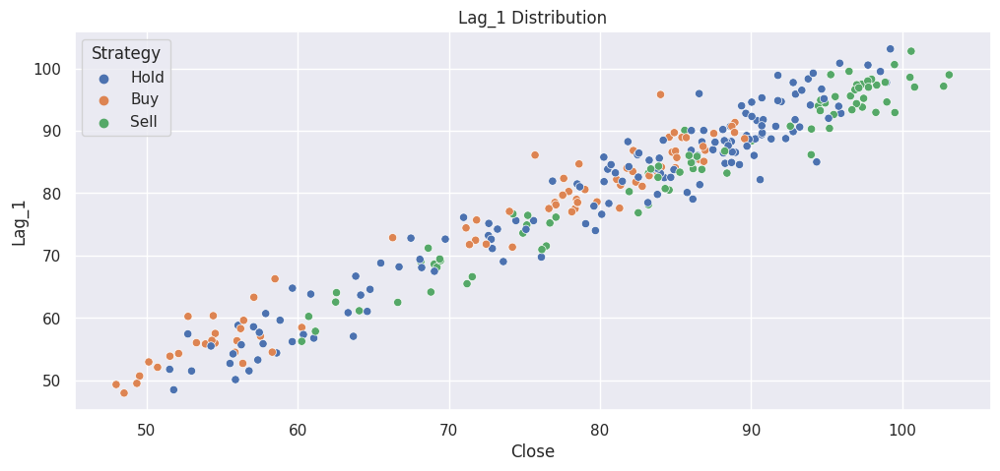

Feature: Lag_1
Description:
count    300.000000
mean      79.420283
std       13.880081
min       47.979353
25%       69.689227
50%       82.991900
75%       89.719145
max      103.119373
Name: Lag_1, dtype: float64



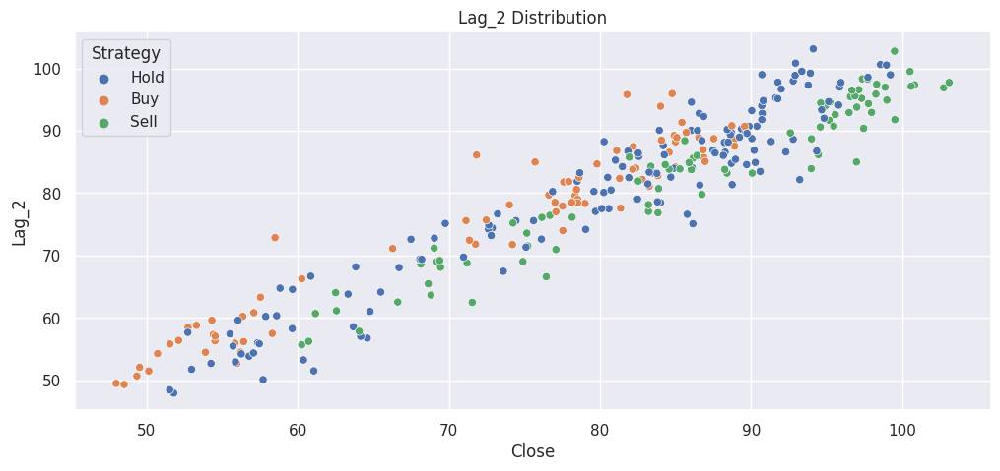

Feature: Lag_2
Description:
count    300.000000
mean      79.402226
std       13.881507
min       47.979353
25%       69.689227
50%       82.991900
75%       89.719145
max      103.119373
Name: Lag_2, dtype: float64



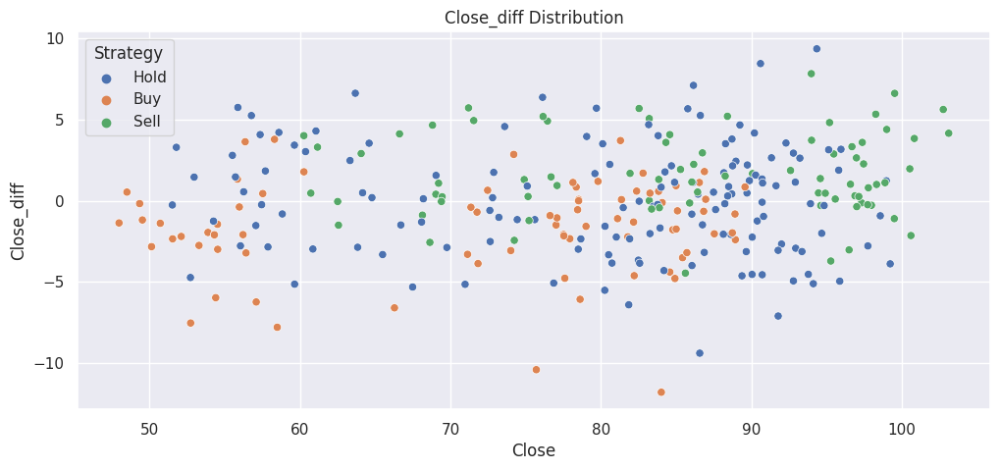

Feature: Close_diff
Description:
count    300.000000
mean       0.006318
std        3.262129
min      -11.790280
25%       -2.113935
50%        0.070739
75%        1.887790
max        9.344885
Name: Close_diff, dtype: float64



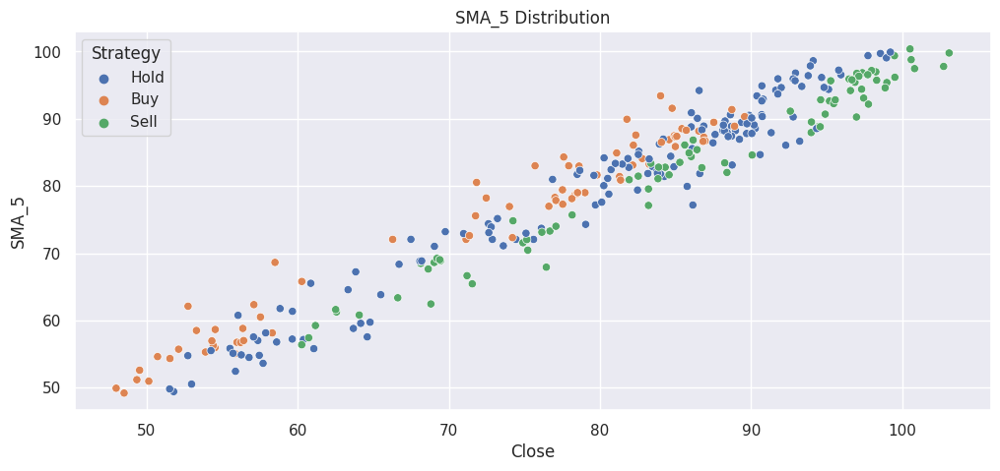

Feature: SMA_5
Description:
count    300.000000
mean      79.357764
std       13.629735
min       49.217847
25%       70.166637
50%       82.807472
75%       89.313006
max      100.394634
Name: SMA_5, dtype: float64



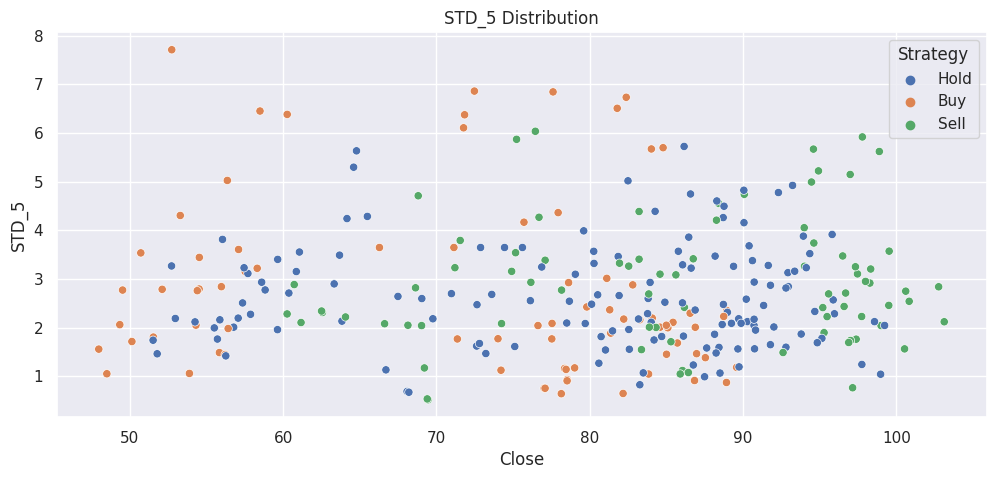

Feature: STD_5
Description:
count    300.000000
mean       2.732473
std        1.346024
min        0.516443
25%        1.815681
50%        2.455306
75%        3.377440
max        7.709347
Name: STD_5, dtype: float64



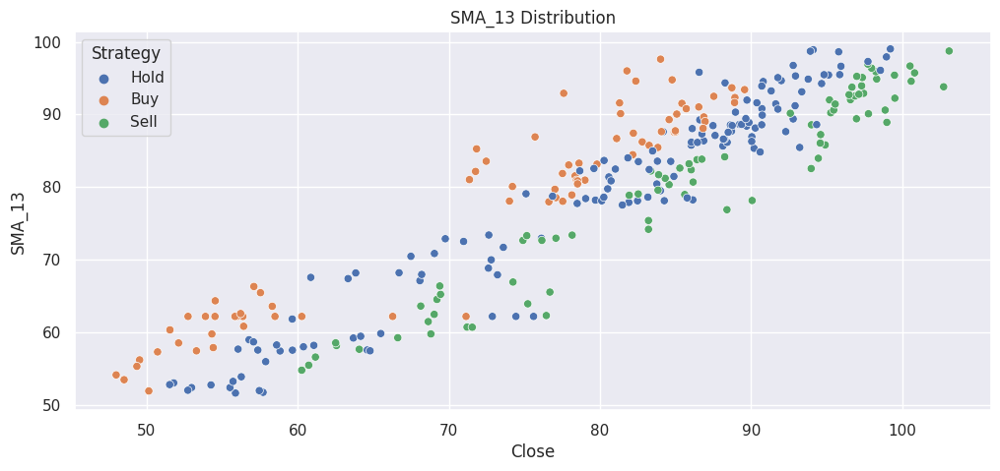

Feature: SMA_13
Description:
count    300.000000
mean      78.931771
std       13.555802
min       51.633615
25%       66.361613
50%       82.449136
75%       89.715634
max       99.018800
Name: SMA_13, dtype: float64



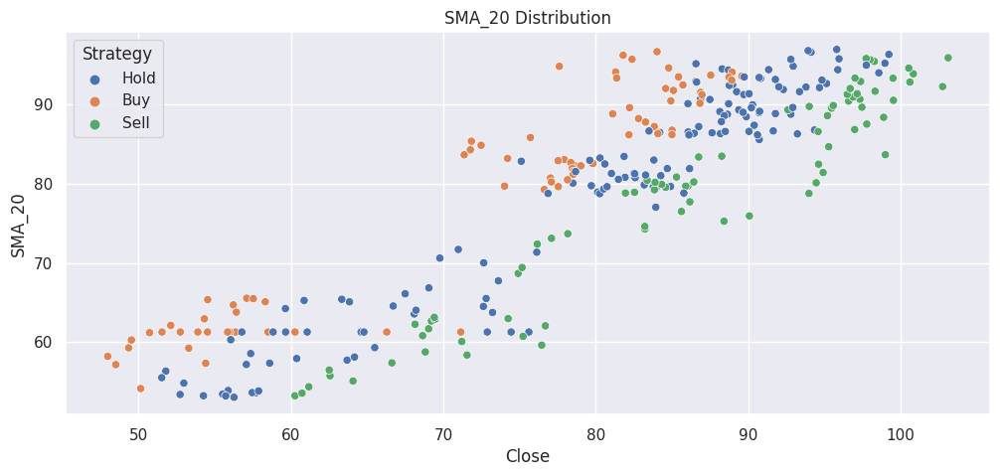

Feature: SMA_20
Description:
count    300.000000
mean      78.692563
std       13.427602
min       53.043800
25%       64.448402
50%       81.943132
75%       90.124836
max       96.980305
Name: SMA_20, dtype: float64



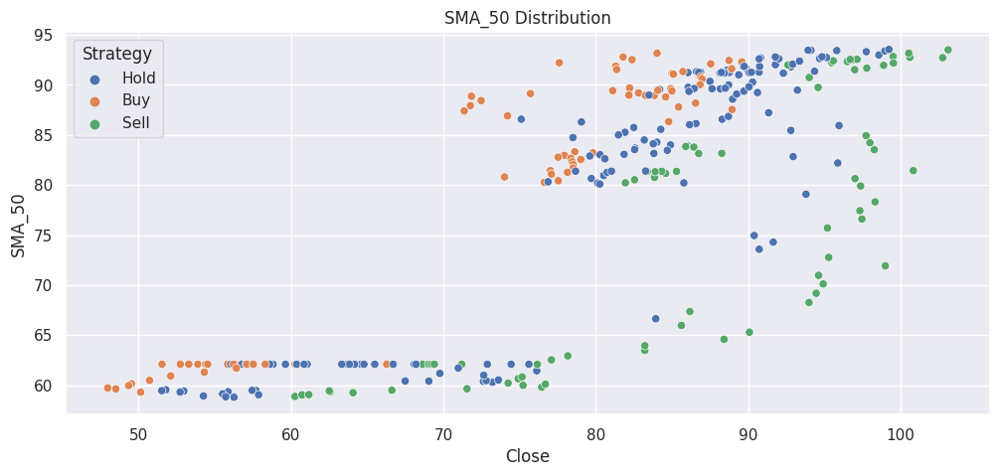

Feature: SMA_50
Description:
count    300.000000
mean      77.890241
std       12.976166
min       58.793071
25%       62.089768
50%       82.429123
75%       89.769275
max       93.542265
Name: SMA_50, dtype: float64



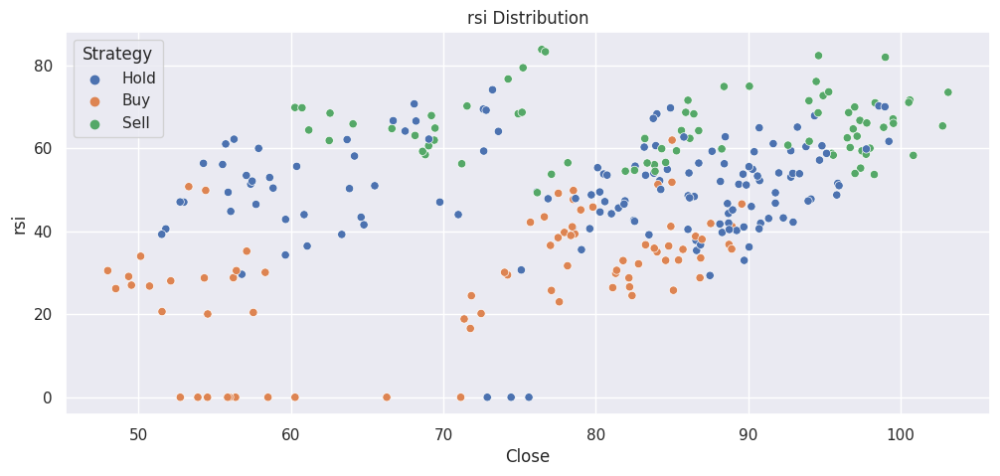

Feature: rsi
Description:
count    300.000000
mean      48.829839
std       17.324633
min        0.000000
25%       39.265004
50%       51.237261
75%       61.075768
max       83.837808
Name: rsi, dtype: float64



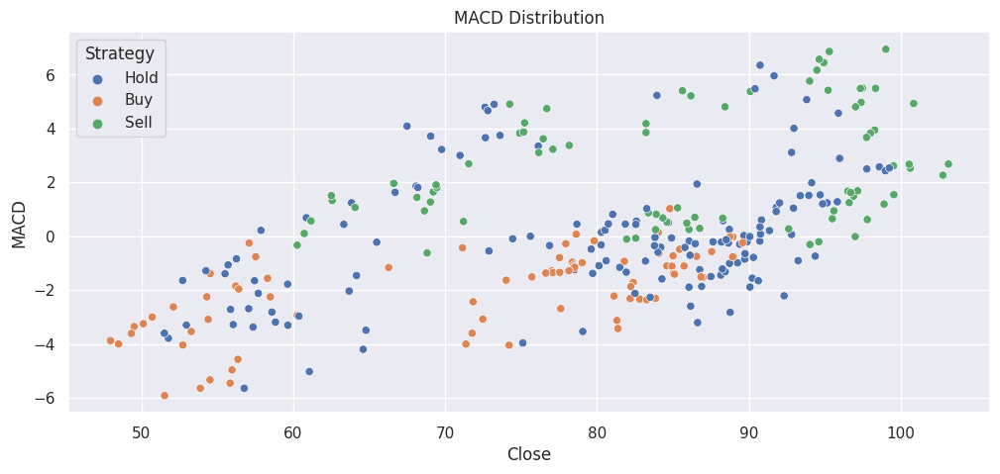

Feature: MACD
Description:
count    300.000000
mean       0.127878
std        2.653661
min       -5.915473
25%       -1.499128
50%       -0.204485
75%        1.510522
max        6.943745
Name: MACD, dtype: float64



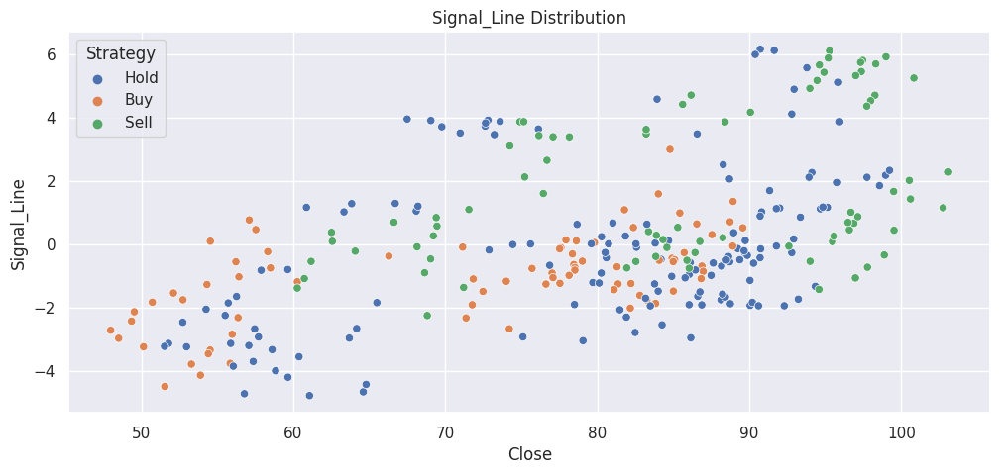

Feature: Signal_Line
Description:
count    300.000000
mean       0.119606
std        2.439007
min       -4.786468
25%       -1.454019
50%       -0.272992
75%        1.137394
max        6.150017
Name: Signal_Line, dtype: float64



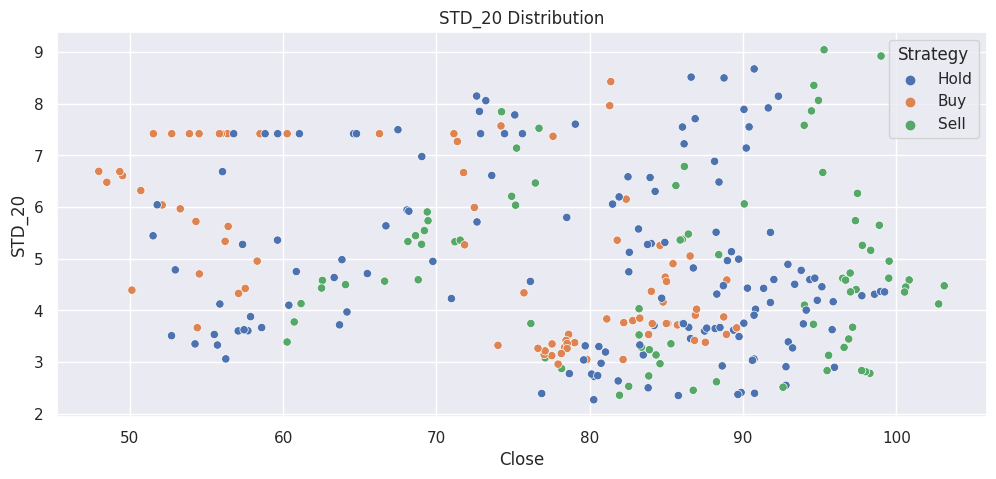

Feature: STD_20
Description:
count    300.000000
mean       4.890859
std        1.668587
min        2.271330
25%        3.536788
50%        4.533933
75%        6.049102
max        9.046441
Name: STD_20, dtype: float64



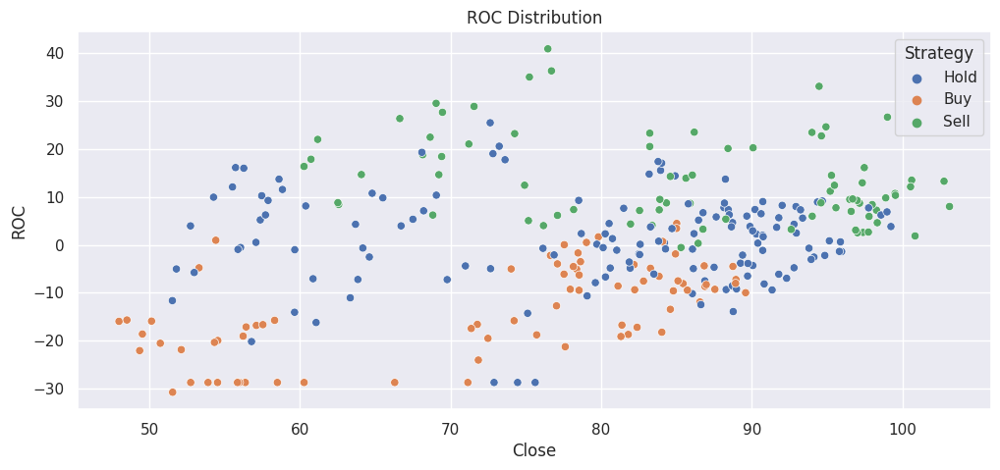

Feature: ROC
Description:
count    300.000000
mean       0.689758
std       13.400078
min      -30.765972
25%       -7.322323
50%        1.678089
75%        8.719774
max       40.908793
Name: ROC, dtype: float64



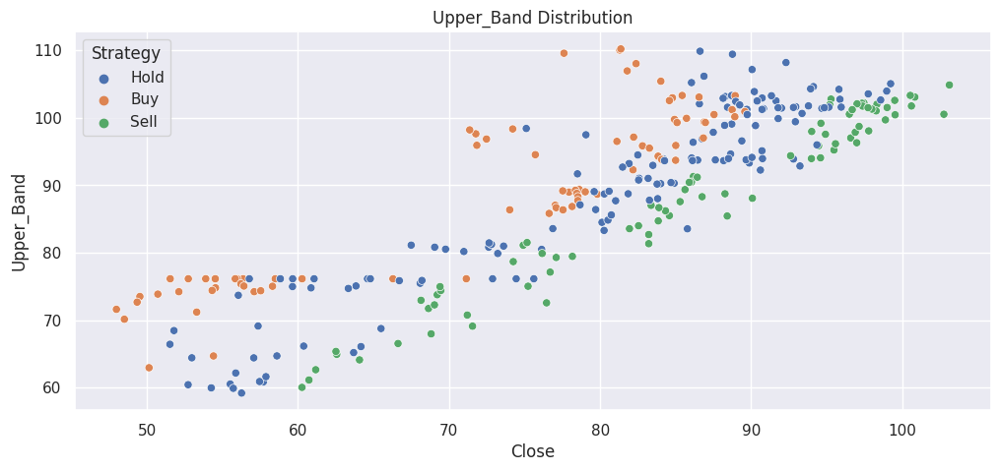

Feature: Upper_Band
Description:
count    300.000000
mean      88.474282
std       13.004154
min       59.169083
25%       76.128710
50%       90.627296
75%       99.992427
max      110.230492
Name: Upper_Band, dtype: float64



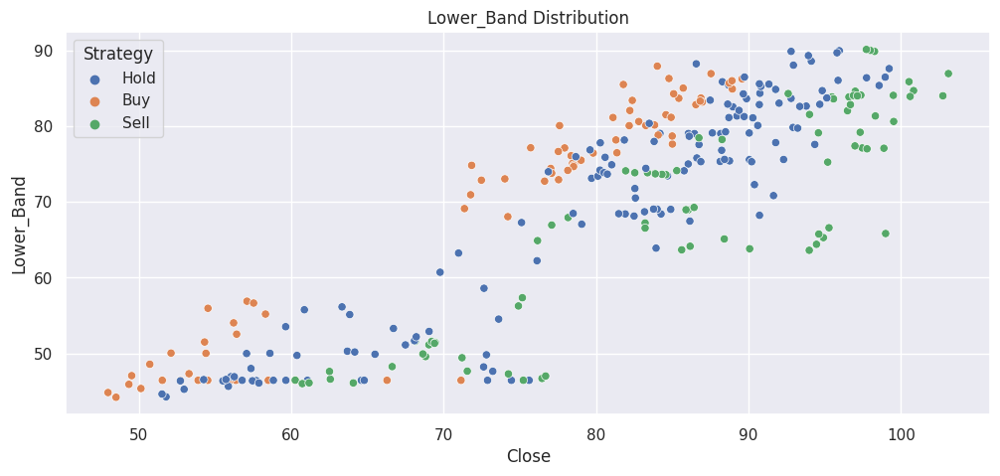

Feature: Lower_Band
Description:
count    300.000000
mean      68.910845
std       14.620753
min       44.202055
25%       52.063125
50%       73.941318
75%       81.215518
max       90.164015
Name: Lower_Band, dtype: float64



In [52]:
# List of feature names
feature_names = ['Lag_1','Lag_2','Close_diff','SMA_5','STD_5','SMA_13','SMA_20','SMA_50','rsi','MACD','Signal_Line','STD_20','ROC','Upper_Band','Lower_Band']

# Loop through each feature, plot, and provide a brief description
for feature_name in feature_names:
    # Create a figure with two subplots
    fig, axis = plt.subplots(1, 1, figsize=(12, 5))

    # Plot the feature
    sns.scatterplot(y=train[feature_name],x=train['Close'],hue=train['Strategy'], ax=axis)
    axis.set_title(f'{feature_name} Distribution')

    # Show the figure
    plt.show()

    # Provide a brief description of the feature
    feature_description = train[feature_name].describe()
    print(f"Feature: {feature_name}")
    print(f"Description:\n{feature_description}\n")

Text(0.5, 1.0, 'Correlation Heatmap')

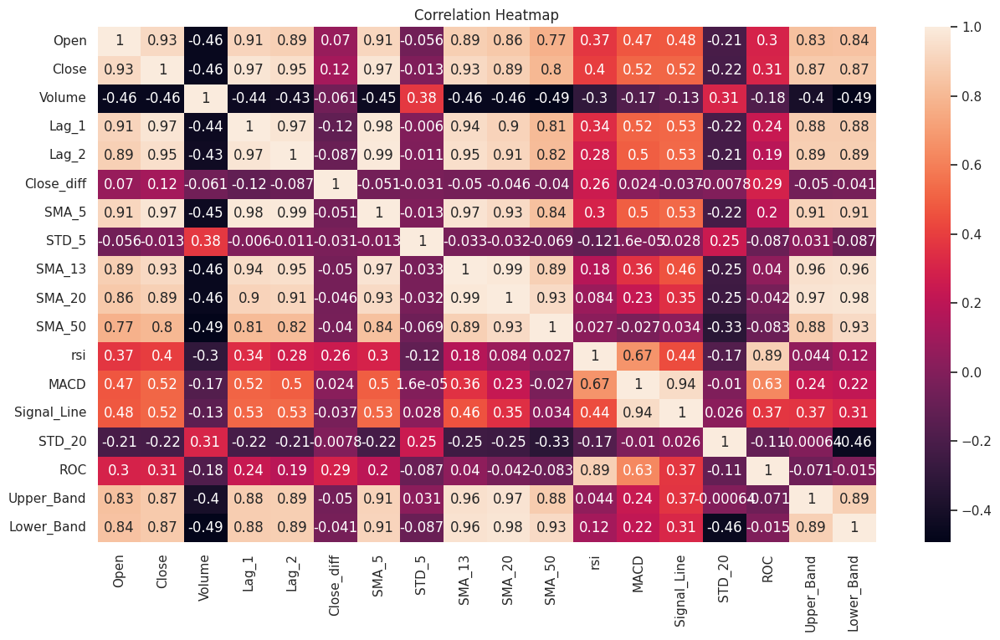

In [53]:
plt.figure(figsize=(15,8))
heatmap = sns.heatmap(train.loc[:,['Open', 'Close', 'Volume','Lag_1','Lag_2','Close_diff','SMA_5','STD_5','SMA_13','SMA_20','SMA_50','rsi','MACD','Signal_Line','STD_20','ROC','Upper_Band','Lower_Band']].corr(), annot=True)
heatmap.set_title('Correlation Heatmap')

# Selecting Features

In [54]:
from sklearn.model_selection import TimeSeriesSplit
classification_features = ['Open', 'Close', 'Volume','Lag_1','Lag_2','Close_diff','SMA_5','STD_5','SMA_13','SMA_20','SMA_50','rsi','MACD','Signal_Line','STD_20','ROC','Upper_Band','Lower_Band']
tss = TimeSeriesSplit(n_splits=2, test_size=int(len(train) * 0.2))
X = train[classification_features]
y = train.loc[:, ['Strategy']]
for train_index, test_index in tss.split(X):
    X_train, X_test = X.iloc[train_index, :], X.iloc[test_index,:]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]
display(X_train.head())
display(X_test.head())
print(f"Number of training samples: {len(X_train)}, Number of validation samples: {len(X_test)}")

,Open,Close,Volume,Lag_1,Lag_2,Close_diff,SMA_5,STD_5,SMA_13,SMA_20,SMA_50,rsi,MACD,Signal_Line,STD_20,ROC,Upper_Band,Lower_Band
Date,,,,,,,,,,,,,,,,,,
2015-06-01,66.208486,75.609978,298506300,75.609978,75.609978,-1.166647,72.07204,3.645382,62.189273,61.285542,62.089768,0.0,0.000000,0.000000,7.421584,-28.725621,76.12871,46.442374
2015-06-08,64.116235,74.443331,227974800,75.609978,75.609978,-1.166647,72.07204,3.645382,62.189273,61.285542,62.089768,0.0,-0.093066,-0.018613,7.421584,-28.725621,76.12871,46.442374
2015-06-15,47.701942,71.140831,250670900,74.443331,75.609978,-3.302500,72.07204,3.645382,62.189273,61.285542,62.089768,0.0,-0.428367,-0.100564,7.421584,-28.725621,76.12871,46.442374
2015-06-22,54.754816,72.881344,223614300,71.140831,74.443331,1.740512,72.07204,3.645382,62.189273,61.285542,62.089768,0.0,-0.547342,-0.189920,7.421584,-28.725621,76.12871,46.442374
2015-06-29,48.031899,66.284718,406814900,72.881344,71.140831,-6.596626,72.07204,3.645382,62.189273,61.285542,62.089768,0.0,-1.160545,-0.384045,7.421584,-28.725621,76.12871,46.442374


,Open,Close,Volume,Lag_1,Lag_2,Close_diff,SMA_5,STD_5,SMA_13,SMA_20,SMA_50,rsi,MACD,Signal_Line,STD_20,ROC,Upper_Band,Lower_Band
Date,,,,,,,,,,,,,,,,,,
2020-01-06,74.811495,71.365903,235950300,71.770781,72.476366,-0.404878,72.632234,1.765871,81.022916,83.674990,87.397954,18.870991,-4.002696,-2.335231,7.270237,-17.456577,98.215464,69.134515
2020-01-13,80.812144,74.212029,206277900,71.365903,71.770781,2.846126,72.332641,1.123340,80.080870,83.211038,86.904480,29.481582,-4.045678,-2.677320,7.572385,-15.837293,98.355808,68.066267
2020-01-20,82.002162,75.110591,134102500,74.212029,71.365903,0.898562,72.987134,1.610763,79.075773,82.857807,86.570967,30.674911,-3.961569,-2.934170,7.785034,-14.284522,98.427874,67.287739
2020-01-27,81.211918,79.059896,186548400,75.110591,74.212029,3.949305,74.303840,3.095449,78.416703,82.280247,86.293671,35.570748,-3.535481,-3.054432,7.605979,-10.662136,97.492206,67.068288
2020-02-03,79.468382,86.154937,217464300,79.059896,75.110591,7.095040,77.180671,5.722292,78.236668,81.926572,86.026215,48.069025,-2.595375,-2.962621,7.225015,2.328863,96.376601,67.476542


Number of training samples: 240, Number of validation samples: 60


In [55]:
train.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 300 entries, 2015-06-01 to 2021-02-22
Data columns (total 51 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     300 non-null    int64  
 1   Open                   300 non-null    float64
 2   Close                  300 non-null    float64
 3   Volume                 300 non-null    int64  
 4   Strategy               300 non-null    object 
 5   Lag_1                  300 non-null    float64
 6   Open_lag               300 non-null    float64
 7   Open_lag2              300 non-null    float64
 8   Open_lag3              300 non-null    float64
 9   Open_lag4              300 non-null    float64
 10  Open_MA_20             300 non-null    float64
 11  Volume_MA_20           300 non-null    float64
 12  Open_Volatility        300 non-null    float64
 13  Weekly_Return          300 non-null    float64
 14  Volume_Lag1            300 non-null    

In [56]:
from sklearn import tree
from sklearn.ensemble import VotingClassifier, StackingClassifier
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import LabelEncoder
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from xgboost import plot_importance
from sklearn.feature_selection import SelectKBest, f_classif

le = LabelEncoder()
y_encoded = le.fit_transform(y)

# Create LightGBM and XGBoost classifiers 
lgbm_classifier = LGBMClassifier(learning_rate=0.05, drop_rate=0.1, max_bin=15, num_leaves=10)
xgb_classifier = XGBClassifier(learning_rate=0.1,n_estimators=130,max_depth=3)

# Create a VotingClassifier with the classifiers
voting_classifier = VotingClassifier(estimators=[
    ('lightgbm', lgbm_classifier),
    ('xgboost', xgb_classifier)
], voting='soft')

# xgb_classifier = XGBClassifier(learning_rate=0.1, n_estimators=150, max_depth=3)
# rf_classifier = RandomForestClassifier(n_estimators=200, max_depth=3, lear)
# catboost_classifier = CatBoostClassifier(iterations=100, depth=3, learning_rate=0.1, silent=True)

# Define the final estimator
# lgbm_classifier = LGBMClassifier(learning_rate=0.05, drop_rate=0.2, max_bin=5, num_leaves=5)

# # Create a StackingClassifier with the classifiers
# stacking_classifier = StackingClassifier(
#     estimators=[
#         ('xgboost', xgb_classifier),
# #         ('rfclassifier',rf_classifier),
# #         ('catboost', catboost_classifier),
#         ('lgbm', lgbm_classifier),
#         ('svm', SVC(kernel='poly')),  # Add SVM classifier
#         ('knn', KNeighborsClassifier(n_neighbors=5))
#     ],
#     stack_method='auto',  # Auto-choose the best method (default)
#     n_jobs=-1  # Use all available CPU cores
# )

# # Create a pipeline that includes feature selection and the StackingClassifier
# k = 10  # Number of features to select with SelectKBest
# clf = Pipeline([
#     ('scaler', StandardScaler()),
#     ('feature_selection', SelectKBest(score_func=f_classif, k=k)),
#     ('classifier', stacking_classifier)
# ])

k = 6  # Number of features to select with SelectKBest
clf = Pipeline([
    ('scaler', StandardScaler()),
    ('feature_selection', SelectKBest(score_func=f_classif, k=k)),
    ('classifier', voting_classifier)
])

clf = clf.fit(X, y_encoded)

/opt/conda/lib/python3.10/site-packages/sklearn/preprocessing/_label.py:116: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [57]:
predicted_values = le.inverse_transform(clf.predict(X))
predicted_values

array(['Hold', 'Hold', 'Buy', 'Hold', 'Buy', 'Buy', 'Buy', 'Buy', 'Buy',
       'Buy', 'Buy', 'Buy', 'Buy', 'Buy', 'Hold', 'Hold', 'Hold', 'Hold',
       'Hold', 'Hold', 'Hold', 'Buy', 'Hold', 'Hold', 'Buy', 'Hold',
       'Hold', 'Hold', 'Hold', 'Sell', 'Hold', 'Sell', 'Sell', 'Sell',
       'Sell', 'Sell', 'Sell', 'Sell', 'Hold', 'Hold', 'Hold', 'Hold',
       'Hold', 'Hold', 'Buy', 'Buy', 'Buy', 'Buy', 'Buy', 'Hold', 'Buy',
       'Buy', 'Buy', 'Buy', 'Buy', 'Buy', 'Buy', 'Buy', 'Hold', 'Hold',
       'Hold', 'Buy', 'Hold', 'Hold', 'Hold', 'Hold', 'Hold', 'Hold',
       'Hold', 'Hold', 'Sell', 'Sell', 'Hold', 'Sell', 'Sell', 'Sell',
       'Sell', 'Sell', 'Sell', 'Sell', 'Sell', 'Sell', 'Sell', 'Hold',
       'Hold', 'Hold', 'Hold', 'Hold', 'Hold', 'Sell', 'Sell', 'Hold',
       'Hold', 'Hold', 'Hold', 'Sell', 'Sell', 'Sell', 'Sell', 'Sell',
       'Sell', 'Sell', 'Sell', 'Hold', 'Sell', 'Sell', 'Sell', 'Sell',
       'Sell', 'Sell', 'Sell', 'Hold', 'Hold', 'Hold', 'Sell', 'Sell',
 

In [58]:
from sklearn.metrics import accuracy_score, classification_report
accuracy = accuracy_score(y, predicted_values) * 100
report = classification_report(y, predicted_values)
print(f"Accuracy: {accuracy}\n")
print(report)

Accuracy: 99.66666666666667

              precision    recall  f1-score   support

         Buy       0.99      1.00      0.99        78
        Hold       1.00      0.99      1.00       143
        Sell       1.00      1.00      1.00        79

    accuracy                           1.00       300
   macro avg       1.00      1.00      1.00       300
weighted avg       1.00      1.00      1.00       300



In [59]:
from sklearn.model_selection import cross_val_score

# Specify the number of folds (k) for cross-validation
k_folds = 5  # You can adjust the number of folds as needed

# Perform k-fold cross-validation
scores = cross_val_score(clf, X, y, cv=k_folds, scoring='accuracy')
# Replace 'accuracy' with the appropriate scoring metric for your classification task

# Print the cross-validation scores
print("Cross-Validation Scores:", scores)
print("Mean Accuracy:", scores.mean())

/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.10/site-packages/sklearn/preprocessing/_label.py:99: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.10/site-packages/sklearn/preprocessing/_label.py:134: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape

Cross-Validation Scores: [0.73333333 0.75       0.73333333 0.78333333 0.76666667]
Mean Accuracy: 0.7533333333333333


# Predicting on test

In [60]:
test = create_features_ts(test)
test.fillna(method='bfill', inplace=True)
test.columns

Index(['Date', 'Open', 'Volume', 'Open_lag', 'Open_lag2', 'Open_lag3',
       'Open_lag4', 'Open_MA_20', 'Volume_MA_20', 'Open_Volatility',
       'Weekly_Return', 'Volume_Lag1', 'Volume_Rolling_Std', 'Price_Change',
       'Volume_Change', 'SMA_5_Open', 'SMA_10_Open', 'SMA_20_Open',
       'SMA_5_Volume', 'SMA_10_Volume', 'SMA_20_Volume', 'EMA_5_Open',
       'EMA_10_Open', 'EMA_20_Open', 'EMA_5_Volume', 'EMA_10_Volume',
       'EMA_20_Volume'],
      dtype='object')

In [61]:
ids = test.index
ids

Index([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35,
       36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53,
       54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71,
       72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89,
       90, 91, 92, 93, 94, 95, 96, 97, 98, 99],
      dtype='int64', name='id')

In [62]:
test.set_index("Date", inplace=True)
test.head()

,Open,Volume,Open_lag,Open_lag2,Open_lag3,Open_lag4,Open_MA_20,Volume_MA_20,Open_Volatility,Weekly_Return,...,SMA_20_Open,SMA_5_Volume,SMA_10_Volume,SMA_20_Volume,EMA_5_Open,EMA_10_Open,EMA_20_Open,EMA_5_Volume,EMA_10_Volume,EMA_20_Volume
Date,,,,,,,,,,,,,,,,,,,,,
2021-03-01,72.708331,205897600,72.708331,72.708331,72.708331,72.708331,70.81569,188484830.0,2.083427,0.008287,...,70.81569,197163160.0,204137180.0,188484830.0,72.708331,72.708331,72.708331,2.058976e+08,2.058976e+08,2.058976e+08
2021-03-08,73.310886,214095600,72.708331,72.708331,72.708331,72.708331,70.81569,188484830.0,2.083427,0.008287,...,70.81569,197163160.0,204137180.0,188484830.0,72.909183,72.817887,72.765717,2.086303e+08,2.073881e+08,2.066784e+08
2021-03-15,70.610119,151601700,73.310886,72.708331,72.708331,72.708331,70.81569,188484830.0,2.083427,-0.036840,...,70.81569,197163160.0,204137180.0,188484830.0,72.142828,72.416474,72.560422,1.896207e+08,1.972452e+08,2.014330e+08
2021-03-22,70.256017,193982500,70.610119,73.310886,72.708331,72.708331,70.81569,188484830.0,2.083427,-0.005015,...,70.81569,197163160.0,204137180.0,188484830.0,71.513891,72.023664,72.340955,1.910747e+08,1.966519e+08,2.007234e+08
2021-03-29,68.258324,220238400,70.256017,70.610119,73.310886,72.708331,70.81569,188484830.0,2.083427,-0.028434,...,70.81569,197163160.0,204137180.0,188484830.0,70.428702,71.339057,71.952133,2.007959e+08,2.009404e+08,2.025820e+08


In [63]:
test.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 100 entries, 2021-03-01 to 2023-01-23
Data columns (total 26 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Open                100 non-null    float64
 1   Volume              100 non-null    int64  
 2   Open_lag            100 non-null    float64
 3   Open_lag2           100 non-null    float64
 4   Open_lag3           100 non-null    float64
 5   Open_lag4           100 non-null    float64
 6   Open_MA_20          100 non-null    float64
 7   Volume_MA_20        100 non-null    float64
 8   Open_Volatility     100 non-null    float64
 9   Weekly_Return       100 non-null    float64
 10  Volume_Lag1         100 non-null    float64
 11  Volume_Rolling_Std  100 non-null    float64
 12  Price_Change        100 non-null    float64
 13  Volume_Change       100 non-null    float64
 14  SMA_5_Open          100 non-null    float64
 15  SMA_10_Open         100 non-null    fl

In [64]:
train.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 300 entries, 2015-06-01 to 2021-02-22
Data columns (total 51 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     300 non-null    int64  
 1   Open                   300 non-null    float64
 2   Close                  300 non-null    float64
 3   Volume                 300 non-null    int64  
 4   Strategy               300 non-null    object 
 5   Lag_1                  300 non-null    float64
 6   Open_lag               300 non-null    float64
 7   Open_lag2              300 non-null    float64
 8   Open_lag3              300 non-null    float64
 9   Open_lag4              300 non-null    float64
 10  Open_MA_20             300 non-null    float64
 11  Volume_MA_20           300 non-null    float64
 12  Open_Volatility        300 non-null    float64
 13  Weekly_Return          300 non-null    float64
 14  Volume_Lag1            300 non-null    

In [65]:
ts_selected_features = ['Open','Open_lag2', 'Open_lag3', 'SMA_5_Open', 'EMA_5_Open','EMA_10_Open']
X = train[ts_selected_features]
y = train.loc[:, 'Close']
display(X.head())
display(y.head())

ts_scaler = RobustScaler()
X = ts_scaler.fit_transform(X)

,Open,Open_lag2,Open_lag3,SMA_5_Open,EMA_5_Open,EMA_10_Open
Date,,,,,,
2015-06-01,66.208486,66.208486,66.208486,56.162676,66.208486,66.208486
2015-06-08,64.116235,66.208486,66.208486,56.162676,65.511069,65.828077
2015-06-15,47.701942,66.208486,66.208486,56.162676,59.574693,62.532416
2015-06-22,54.754816,64.116235,66.208486,56.162676,57.968068,61.118307
2015-06-29,48.031899,47.701942,64.116235,56.162676,54.656012,58.738960


Date
2015-06-01    75.609978
2015-06-08    74.443331
2015-06-15    71.140831
2015-06-22    72.881344
2015-06-29    66.284718
Name: Close, dtype: float64

In [66]:
# Define the SARIMA model with appropriate orders
exog=sm.add_constant(X)
# Fit the SARIMA model to the training data
model = sm.tsa.SARIMAX(y, exog=exog, order=order, seasonal_order=seasonal_order)
results = model.fit()
results.summary()

/opt/conda/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-MON will be used.
  self._init_dates(dates, freq)
/opt/conda/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-MON will be used.
  self._init_dates(dates, freq)
/opt/conda/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/opt/conda/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.01352D+00    |proj g|=  2.33644D-02

At iterate    5    f=  2.01315D+00    |proj g|=  2.70021D-03

At iterate   10    f=  2.01308D+00    |proj g|=  9.20793D-04

At iterate   15    f=  2.01295D+00    |proj g|=  1.06058D-02

At iterate   20    f=  2.01276D+00    |proj g|=  2.08753D-03

At iterate   25    f=  2.01261D+00    |proj g|=  1.64036D-03

At iterate   30    f=  2.01257D+00    |proj g|=  2.60978D-04

At iterate   35    f=  2.01257D+00    |proj g|=  7.86394D-04

At iterate   40    f=  2.01254D+00    |proj g|=  1.20718D-03

At iterate   45    f=  2.01251D+00    |proj g|=  2.65669D-04

At iterate   50    f=  2.01251D+00    |proj g|=  1.36474D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

/opt/conda/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                              Close   No. Observations:                  300
Model:             SARIMAX(1, 0, 1)x(1, 0, [], 4)   Log Likelihood                -603.753
Date:                            Sat, 04 Nov 2023   AIC                           1229.506
Time:                                    07:10:00   BIC                           1270.247
Sample:                                06-01-2015   HQIC                          1245.810
                                     - 02-22-2021                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         82.9270      0.127    653.105      0.000      82.678      83.176
x1            -6.0405      1.727     -3.497      0.000      -9.426      -2.655
x2            -0.3760      1.143     -0.329      0.742      -2.617       1.865
x3            14.4816      0.814     17.797      0.000      12.887      16.076
x4            -2.1613      1.897     -1.139      0.255      -5.879       1.557
x5            17.4153      5.112      3.407      0.001       7.395      27.435
x6            -3.9321      2.325     -1.691      0.091      -8.489       0.624
ar.L1          0.5857      0.899      0.652      0.515      -1.176       2.347
ma.L1         -0.5471      0.928     -0.590      0.555      -2.365       1.271
ar.S.L4       -0.0248      0.067     -0.370      0.712      -0.156       0.107
sigma2         3.2774      0.314     10.440      0.000       2.662       3.893
===================================================================================
Ljung-Box (L1) (Q):                   0.03   Jarque-Bera (JB):                 3.36
Prob(Q):                              0.87   Prob(JB):                         0.19
Heteroskedasticity (H):               1.23   Skew:                             0.10
Prob(H) (two-sided):                  0.31   Kurtosis:                         2.52
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [67]:
# Forecast future values (specify the number of periods to forecast)
forecast_periods = len(test)  # You can change this to the number of periods you want to forecast
forecast = results.get_forecast(steps=forecast_periods, exog=sm.add_constant(ts_scaler.transform(test[ts_selected_features])))

# Extract the predicted values and associated confidence intervals
test['Close'] = forecast.predicted_mean
conf_int = forecast.conf_int()
test.head()

,Open,Volume,Open_lag,Open_lag2,Open_lag3,Open_lag4,Open_MA_20,Volume_MA_20,Open_Volatility,Weekly_Return,...,SMA_5_Volume,SMA_10_Volume,SMA_20_Volume,EMA_5_Open,EMA_10_Open,EMA_20_Open,EMA_5_Volume,EMA_10_Volume,EMA_20_Volume,Close
Date,,,,,,,,,,,,,,,,,,,,,
2021-03-01,72.708331,205897600,72.708331,72.708331,72.708331,72.708331,70.81569,188484830.0,2.083427,0.008287,...,197163160.0,204137180.0,188484830.0,72.708331,72.708331,72.708331,2.058976e+08,2.058976e+08,2.058976e+08,76.822280
2021-03-08,73.310886,214095600,72.708331,72.708331,72.708331,72.708331,70.81569,188484830.0,2.083427,0.008287,...,197163160.0,204137180.0,188484830.0,72.909183,72.817887,72.765717,2.086303e+08,2.073881e+08,2.066784e+08,76.808132
2021-03-15,70.610119,151601700,73.310886,72.708331,72.708331,72.708331,70.81569,188484830.0,2.083427,-0.036840,...,197163160.0,204137180.0,188484830.0,72.142828,72.416474,72.560422,1.896207e+08,1.972452e+08,2.014330e+08,77.028086
2021-03-22,70.256017,193982500,70.610119,73.310886,72.708331,72.708331,70.81569,188484830.0,2.083427,-0.005015,...,197163160.0,204137180.0,188484830.0,71.513891,72.023664,72.340955,1.910747e+08,1.966519e+08,2.007234e+08,76.587070
2021-03-29,68.258324,220238400,70.256017,70.610119,73.310886,72.708331,70.81569,188484830.0,2.083427,-0.028434,...,197163160.0,204137180.0,188484830.0,70.428702,71.339057,71.952133,2.007959e+08,2.009404e+08,2.025820e+08,76.858019


In [68]:
calculate_features_classification(test)
test.fillna(method='bfill', inplace=True)
display(test.head())
display(test.tail())

,Open,Volume,Open_lag,Open_lag2,Open_lag3,Open_lag4,Open_MA_20,Volume_MA_20,Open_Volatility,Weekly_Return,...,EMA_26,MACD,Signal_Line,SMA_20,STD_20,Upper_Band,Lower_Band,ROC,SMA_13,SMA_50
Date,,,,,,,,,,,,,,,,,,,,,
2021-03-01,72.708331,205897600,72.708331,72.708331,72.708331,72.708331,70.81569,188484830.0,2.083427,0.008287,...,76.822280,0.000000,0.000000,75.466684,1.464264,78.395211,72.538157,-4.656428,75.358207,78.696346
2021-03-08,73.310886,214095600,72.708331,72.708331,72.708331,72.708331,70.81569,188484830.0,2.083427,0.008287,...,76.821232,-0.001129,-0.000226,75.466684,1.464264,78.395211,72.538157,-4.656428,75.358207,78.696346
2021-03-15,70.610119,151601700,73.310886,72.708331,72.708331,72.708331,70.81569,188484830.0,2.083427,-0.036840,...,76.836555,0.015546,0.002929,75.466684,1.464264,78.395211,72.538157,-4.656428,75.358207,78.696346
2021-03-22,70.256017,193982500,70.610119,73.310886,72.708331,72.708331,70.81569,188484830.0,2.083427,-0.005015,...,76.818074,-0.006747,0.000993,75.466684,1.464264,78.395211,72.538157,-4.656428,75.358207,78.696346
2021-03-29,68.258324,220238400,70.256017,70.610119,73.310886,72.708331,70.81569,188484830.0,2.083427,-0.028434,...,76.821033,-0.002523,0.000290,75.466684,1.464264,78.395211,72.538157,-4.656428,75.358207,78.696346


,Open,Volume,Open_lag,Open_lag2,Open_lag3,Open_lag4,Open_MA_20,Volume_MA_20,Open_Volatility,Weekly_Return,...,EMA_26,MACD,Signal_Line,SMA_20,STD_20,Upper_Band,Lower_Band,ROC,SMA_13,SMA_50
Date,,,,,,,,,,,,,,,,,,,,,
2022-12-26,57.048622,224994700,55.184092,58.417757,59.428165,57.967017,57.873293,230859910.0,4.005317,0.033787,...,66.617122,-2.645024,-3.067414,64.766927,3.311239,71.389405,58.144449,-4.071120,64.226696,72.049423
2023-01-02,60.569661,176020500,57.048622,55.184092,58.417757,59.428165,57.985505,232542980.0,4.049839,0.061720,...,66.413028,-2.457891,-2.945510,64.510876,3.162739,70.836353,58.185398,-4.812409,63.960323,71.822168
2023-01-09,61.446777,181478600,60.569661,57.048622,55.184092,58.417757,58.322605,229241195.0,4.042975,0.014481,...,66.107696,-2.408572,-2.838122,64.167405,3.000042,70.167489,58.167320,-6.218963,63.591133,71.559072
2023-01-16,55.447711,162471700,61.446777,60.569661,57.048622,55.184092,58.457118,225643090.0,3.889929,-0.097630,...,65.959555,-2.197560,-2.710010,63.984863,2.878643,69.742148,58.227578,-4.041401,63.413132,71.381335
2023-01-23,57.008939,178924000,55.447711,61.446777,60.569661,57.048622,58.173850,224112490.0,3.771132,0.028157,...,65.933855,-1.887150,-2.545438,64.093359,2.897960,69.889279,58.297439,-5.448232,63.321198,71.178557


In [69]:
test.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 100 entries, 2021-03-01 to 2023-01-23
Data columns (total 47 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Open                100 non-null    float64
 1   Volume              100 non-null    int64  
 2   Open_lag            100 non-null    float64
 3   Open_lag2           100 non-null    float64
 4   Open_lag3           100 non-null    float64
 5   Open_lag4           100 non-null    float64
 6   Open_MA_20          100 non-null    float64
 7   Volume_MA_20        100 non-null    float64
 8   Open_Volatility     100 non-null    float64
 9   Weekly_Return       100 non-null    float64
 10  Volume_Lag1         100 non-null    float64
 11  Volume_Rolling_Std  100 non-null    float64
 12  Price_Change        100 non-null    float64
 13  Volume_Change       100 non-null    float64
 14  SMA_5_Open          100 non-null    float64
 15  SMA_10_Open         100 non-null    fl

In [70]:
test.head()

,Open,Volume,Open_lag,Open_lag2,Open_lag3,Open_lag4,Open_MA_20,Volume_MA_20,Open_Volatility,Weekly_Return,...,EMA_26,MACD,Signal_Line,SMA_20,STD_20,Upper_Band,Lower_Band,ROC,SMA_13,SMA_50
Date,,,,,,,,,,,,,,,,,,,,,
2021-03-01,72.708331,205897600,72.708331,72.708331,72.708331,72.708331,70.81569,188484830.0,2.083427,0.008287,...,76.822280,0.000000,0.000000,75.466684,1.464264,78.395211,72.538157,-4.656428,75.358207,78.696346
2021-03-08,73.310886,214095600,72.708331,72.708331,72.708331,72.708331,70.81569,188484830.0,2.083427,0.008287,...,76.821232,-0.001129,-0.000226,75.466684,1.464264,78.395211,72.538157,-4.656428,75.358207,78.696346
2021-03-15,70.610119,151601700,73.310886,72.708331,72.708331,72.708331,70.81569,188484830.0,2.083427,-0.036840,...,76.836555,0.015546,0.002929,75.466684,1.464264,78.395211,72.538157,-4.656428,75.358207,78.696346
2021-03-22,70.256017,193982500,70.610119,73.310886,72.708331,72.708331,70.81569,188484830.0,2.083427,-0.005015,...,76.818074,-0.006747,0.000993,75.466684,1.464264,78.395211,72.538157,-4.656428,75.358207,78.696346
2021-03-29,68.258324,220238400,70.256017,70.610119,73.310886,72.708331,70.81569,188484830.0,2.083427,-0.028434,...,76.821033,-0.002523,0.000290,75.466684,1.464264,78.395211,72.538157,-4.656428,75.358207,78.696346


In [71]:
test['Strategy'] = le.inverse_transform(clf.predict(test[classification_features]))

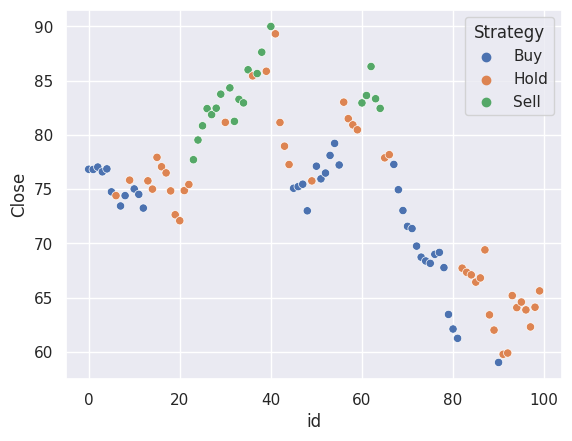

In [72]:
test['Date'] = test.index
test['id'] = ids
test.set_index('id', inplace=True)
sns.scatterplot(x=test.index, y="Close", hue="Strategy", data=test)
plt.legend(title="Strategy")
# fig.tight_layout()
plt.show()

In [73]:
submission = test.loc[:,['Date','Close','Strategy']]
display(submission.head())

,Date,Close,Strategy
id,,,
0,2021-03-01,76.822280,Buy
1,2021-03-08,76.808132,Buy
2,2021-03-15,77.028086,Buy
3,2021-03-22,76.587070,Buy
4,2021-03-29,76.858019,Buy


In [74]:
submission.to_csv('submission.csv', index=True)